## 2 - Export Data Assessment (Pupil)

##### Imports

In [1]:
import os
import pandas as pd
import numpy as np
import scipy as su
# from typing import Dict
# from scipy.signal import
# from scikit-learn import

import matplotlib.pyplot as plt
import seaborn as sns

import dask.dataframe as dd

##### Data Loading

In [2]:
# Load ddfs into dictionary (exception for 'all_surf_pos', df)
root_dir = './aggregated_data'
def load_data(root_dir, exception=False):    # Get csv file reads into one dictionary
    data = {}
    for subdir, _, files in os.walk(root_dir):
        for file in files:
            file_path = os.path.join(subdir, file)
            file_name = os.path.splitext(file)[0]   #file name without '.csv'
            if file.endswith('.csv') and file != 'all_surf_positions_HiDrive_Studie2.csv':
                data[file_name] = dd.read_csv(file_path)    #read and attach to dict
            elif exception and file == 'all_surf_positions_HiDrive_Studie2.csv':
                data [file_name] = pd.read_csv(file_path, converters=converters)    #read as normal and attach to dict
    return data
def parse(filedata): # Manually read the column
    output = []
    for line in filedata.split('\n'): # split into lines
        line = line.strip().rstrip(']').lstrip('[') #remove whitespace and brackets
        if not line:
            continue    #skip empty lines
        line = line.split() #split into cell
        row = []
        for cell in line:
            cell = cell.strip()     #remove whitespace
            if not cell.strip():
                continue    #skip empty cells
            row.append(float(cell)) #convert to float and add
        output.append(row)
    return output
converters = {
    "img_to_surf_trans": parse,
    "surf_to_img_trans": parse,
    "dist_img_to_surf_trans": parse,
    "surf_to_dist_img_trans": parse,
}

data = load_data(root_dir)

In [3]:
participant_ids = [1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
columns = ['participant_id', 'pupil_timestamp', 'world_index', 'eye_id', 'confidence', 'diameter', 'diameter_3d', 'model_confidence']
ddf = data['all_pupil_positions'].loc[:, columns].dropna()
eye0 = ddf[ddf['eye_id'] == 0]
eye1 = ddf[ddf['eye_id'] == 1]
df = ddf.compute()

In [8]:
df

,participant_id,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
0,1,-672842.716962,0,1,1.000000,24.017612,2.423617,1.0
3,1,-672842.712905,0,0,1.000000,21.469335,2.372207,1.0
5,1,-672842.708926,0,1,1.000000,23.811779,2.403069,1.0
7,1,-672842.705097,0,0,1.000000,20.864298,2.307640,1.0
8,1,-672842.705086,0,1,1.000000,23.796506,2.402148,1.0
...,...,...,...,...,...,...,...,...
167231,20,83997.384082,104720,1,0.342603,27.745023,2.359141,1.0
167232,20,83997.388062,104721,0,0.993779,24.860444,2.426650,1.0
167234,20,83997.392306,104721,1,0.317278,28.657947,2.437157,1.0
167237,20,83997.396066,104721,0,0.925248,24.513299,2.392751,1.0


### 1. Inspection
Head & Tail,  Basic statistics,  Missing values

##### Head & tail

In [4]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].head())
    display(participant_df.iloc[:, 1:].tail())

'Participant 1'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
0,-672842.716962,0,1,1.0,24.017612,2.423617,1.0
3,-672842.712905,0,0,1.0,21.469335,2.372207,1.0
5,-672842.708926,0,1,1.0,23.811779,2.403069,1.0
7,-672842.705097,0,0,1.0,20.864298,2.307640,1.0
8,-672842.705086,0,1,1.0,23.796506,2.402148,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
165680,-668799.324139,116962,0,1.0,24.952226,3.042095,1.0
165681,-668799.320099,116962,1,1.0,25.869089,3.023711,1.0
165684,-668799.316121,116962,0,1.0,24.914235,3.037282,1.0
165686,-668799.312123,116962,1,1.0,25.498595,2.980826,1.0
165687,-668799.308128,116962,0,1.0,24.826824,3.027231,1.0


'Participant 2'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
165689,-664549.391040,0,0,1.000000,23.327072,2.117716,1.0
165691,-664549.391035,0,1,0.779998,25.128585,2.562297,1.0
165694,-664549.383046,0,0,1.000000,23.661522,2.147691,1.0
165695,-664549.383037,0,1,0.811952,25.154020,2.564631,1.0
165698,-664549.374991,0,0,1.000000,23.676780,2.149017,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
21380,-661485.334275,90024,0,0.837839,25.946599,2.395713,1.0
21381,-661485.330277,90024,1,1.000000,23.176089,2.628631,1.0
21384,-661485.326284,90024,0,0.892206,26.001750,2.403863,1.0
21386,-661485.322204,90024,1,1.000000,22.833106,2.581075,1.0
21387,-661485.318225,90024,0,0.990000,25.676042,2.386070,1.0


'Participant 4'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
21389,-587761.668042,0,1,1.000000,22.482266,1.859968,1.0
21391,-587761.664142,0,0,0.867002,31.775607,3.028025,1.0
21393,-587761.660115,0,1,1.000000,22.720538,1.879872,1.0
21395,-587761.656140,0,0,0.934455,31.695786,3.021394,1.0
21397,-587761.652082,0,1,1.000000,22.920187,1.896740,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
66862,-584619.485936,81083,1,0.793678,12.503182,1.272023,1.0
66864,-584619.482248,81084,0,0.494414,28.764428,2.779420,1.0
66865,-584619.479515,81084,1,0.798053,13.395759,1.364278,1.0
66868,-584619.471775,81084,0,0.600000,28.731948,2.767004,1.0
66869,-584619.471394,81084,1,0.452685,26.496098,2.754017,1.0


'Participant 5'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
66872,-578913.034474,0,1,0.99679,27.223293,2.531768,1.0
66874,-578913.034443,0,0,1.00000,35.384590,2.909746,1.0
66875,-578913.026502,0,0,1.00000,35.168175,2.892652,1.0
66877,-578913.026500,0,1,1.00000,27.388556,2.546625,1.0
66880,-578913.018545,0,0,1.00000,35.337806,2.906756,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
52630,-575204.197744,100853,1,1.0,27.103804,2.539173,1.0
52632,-575204.189931,100853,0,1.0,43.512958,3.226960,1.0
52634,-575204.189835,100853,1,1.0,27.190521,2.547818,1.0
52636,-575204.181952,100853,0,1.0,43.468250,3.223082,1.0
52638,-575204.181922,100853,1,1.0,27.264408,2.555342,1.0


'Participant 6'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
52640,82162.227224,0,0,1.000000,30.149296,2.322044,1.0
52642,82162.231205,0,1,0.727269,26.909082,2.744870,1.0
52644,82162.235173,0,0,1.000000,30.267202,2.328803,1.0
52646,82162.239239,0,1,0.892478,27.052589,2.760662,1.0
52648,82162.243237,0,0,1.000000,29.913411,2.301607,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
154029,85415.405379,96775,1,1.000000,29.946858,2.940517,1.0
154032,85415.413308,96776,0,1.000000,35.054137,2.735436,1.0
154033,85415.413313,96776,1,1.000000,29.792772,2.925472,1.0
154037,85415.421318,96776,1,0.973472,29.688104,2.915035,1.0
154038,85415.421318,96776,0,1.000000,34.904618,2.724829,1.0


'Participant 7'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
154040,349980.583227,0,0,1.000000,46.280965,3.402546,1.0
154042,349980.587219,0,1,0.986849,46.881026,4.617271,1.0
154044,349980.591301,0,0,1.000000,46.434574,3.413928,1.0
154045,349980.595255,0,1,0.996723,46.849063,4.614289,1.0
154048,349980.599246,0,0,1.000000,46.286131,3.403104,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
66051,353175.966203,95269,0,1.0,34.430775,2.930030,1.0
66053,353175.970253,95270,1,1.0,30.109863,3.016150,1.0
66055,353175.974288,95270,0,1.0,34.476987,2.936141,1.0
66058,353175.978301,95270,1,1.0,30.181867,3.021500,1.0
66059,353175.982316,95270,0,1.0,34.124098,2.910757,1.0


'Participant 8'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
66061,4131.599973,0,1,0.99,26.595469,2.738154,1.0
66063,4131.599977,0,0,0.99,38.059469,2.869603,1.0
66065,4131.610142,0,1,0.99,26.373119,2.722775,1.0
66067,4131.610173,0,0,0.99,38.049613,2.867339,1.0
66070,4131.614624,0,0,0.99,38.485919,2.898629,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
157535,7344.889950,95837,1,1.000000,27.493479,2.773605,1.0
157537,7344.893938,95837,0,0.753696,20.493276,2.109999,1.0
157538,7344.897969,95837,1,1.000000,28.978751,2.925168,1.0
157540,7344.901936,95837,0,0.255640,36.024579,3.713708,1.0
157542,7344.905933,95837,1,1.000000,29.337600,2.962395,1.0


'Participant 9'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
157544,22196.694964,0,0,1.0,35.722677,3.266023,1.0
157547,22196.701965,0,1,1.0,23.672214,2.809198,1.0
157548,22196.704012,0,0,1.0,35.155913,3.215400,1.0
157551,22196.706940,0,1,1.0,23.741742,2.817564,1.0
157552,22196.710944,0,0,1.0,35.505077,3.250504,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
84034,25449.586413,97013,1,1.0,25.540090,3.112846,1.0
84036,25449.594288,97014,0,1.0,38.557453,3.260229,1.0
84039,25449.594324,97014,1,1.0,25.610265,3.122284,1.0
84040,25449.602364,97014,1,1.0,25.436786,3.101430,1.0
84042,25449.602379,97014,0,1.0,38.574898,3.260600,1.0


'Participant 10'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
84045,5423.374675,0,0,0.911808,49.030532,3.915407,1.0
84046,5423.374683,0,1,1.000000,32.360557,3.457980,1.0
84049,5423.382661,0,1,1.000000,32.108908,3.430389,1.0
84050,5423.382687,0,0,0.847721,49.157900,3.925984,1.0
84052,5423.390582,0,0,0.834118,48.729379,3.891155,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
42718,8724.197586,98431,1,0.425019,24.493862,2.823084,1.0
42720,8724.201612,98431,0,1.000000,40.170104,3.485549,1.0
42721,8724.205598,98431,1,0.422270,22.945086,2.641855,1.0
42723,8724.209611,98431,0,1.000000,39.555792,3.428184,1.0
42725,8724.213606,98431,1,0.328320,22.133209,2.540276,1.0


'Participant 11'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
42727,16541.755282,0,1,1.0,21.038336,2.303509,1.0
42730,16541.759306,0,0,1.0,30.072905,3.113596,1.0
42732,16541.763325,0,1,1.0,21.081193,2.308160,1.0
42734,16541.767245,0,0,1.0,30.123976,3.118474,1.0
42735,16541.771253,0,1,1.0,20.979532,2.297791,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
140398,19781.538336,96621,1,1.000000,21.944585,2.628570,1.0
140400,19781.542359,96621,0,1.000000,29.922898,2.952339,1.0
140402,19781.546385,96621,1,0.996044,22.171021,2.655596,1.0
140404,19781.550313,96621,0,1.000000,30.102300,2.970758,1.0
140406,19781.554367,96621,1,1.000000,21.928153,2.626190,1.0


'Participant 12'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
140408,84203.906368,0,0,0.000000,0.000000,-0.095549,0.1
140411,84203.906387,0,1,0.830888,25.101973,2.351369,1.0
140412,84203.914345,0,1,0.879920,26.093312,2.444972,1.0
140415,84203.914393,0,0,0.000000,0.000000,-0.095549,0.1
140416,84203.922351,0,0,0.768226,26.382033,2.725270,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
68109,87442.087926,96569,0,1.0,23.961147,2.473622,1.0
68111,87442.091943,96569,1,1.0,25.167343,2.412656,1.0
68113,87442.095992,96569,0,1.0,24.137177,2.491626,1.0
68115,87442.099963,96569,1,1.0,25.449694,2.441232,1.0
68118,87442.104046,96569,0,1.0,23.705710,2.447731,1.0


'Participant 13'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
68119,93626.218938,0,0,1.000000,24.559450,2.871433,1.0
68121,93626.222881,0,1,0.895729,23.700632,2.477347,1.0
68124,93626.226912,0,0,1.000000,24.573823,2.873255,1.0
68126,93626.230958,0,1,1.000000,24.048577,2.513829,1.0
68127,93626.234830,0,0,1.000000,24.686040,2.885725,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
43837,97300.512646,109565,0,1.0,24.137691,3.158494,1.0
43839,97300.516631,109566,1,1.0,24.539784,2.968937,1.0
43841,97300.520687,109566,0,1.0,23.935449,3.131064,1.0
43843,97300.524648,109566,1,1.0,24.564073,2.971776,1.0
43844,97300.528657,109566,0,1.0,24.152996,3.159995,1.0


'Participant 14'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
43847,99784.673771,0,0,1.0,27.597592,2.050000,1.0
43848,99784.677798,0,1,1.0,27.954181,2.205046,1.0
43851,99784.681780,0,0,1.0,27.802087,2.065531,1.0
43853,99784.685815,0,1,1.0,27.850967,2.196666,1.0
43854,99784.689826,0,0,1.0,27.432901,2.038227,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
88264,103247.127471,103240,1,1.0,31.028071,2.992325,1.0
88266,103247.135424,103241,0,1.0,28.229059,2.494369,1.0
88269,103247.135465,103241,1,1.0,31.117725,3.000985,1.0
88271,103247.143422,103241,0,1.0,28.209490,2.493147,1.0
88272,103247.143439,103241,1,1.0,31.014969,2.991053,1.0


'Participant 15'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
88275,3148.488372,0,1,0.789256,46.204463,4.019321,1.0
88276,3148.492389,0,0,1.000000,47.620789,4.064412,1.0
88278,3148.496370,0,1,0.811733,46.371074,4.033782,1.0
88281,3148.500321,0,0,1.000000,47.598920,4.062305,1.0
88283,3148.504505,0,1,0.907116,46.368447,4.033420,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
52102,6444.406056,98273,1,1.000000,27.598856,2.367349,1.0
52103,6444.414114,98274,0,1.000000,28.827743,2.687585,1.0
52106,6444.414114,98274,1,1.000000,27.540956,2.362597,1.0
52108,6444.422120,98274,0,0.945725,28.879926,2.692652,1.0
52109,6444.422143,98274,1,1.000000,27.650318,2.371752,1.0


'Participant 16'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
52112,87725.774092,0,1,1.0,30.416501,3.474288,1.0
52113,87725.774212,0,0,1.0,32.130841,3.495893,1.0
52115,87725.782127,0,0,1.0,32.697231,3.557919,1.0
52118,87725.782143,0,1,1.0,30.396932,3.472692,1.0
52119,87725.790089,0,1,1.0,30.278955,3.459560,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
63920,91478.738591,111916,1,0.908039,25.760457,3.167624,1.0
63922,91478.742624,111916,0,1.000000,26.073439,2.913180,1.0
63925,91478.746622,111916,1,1.000000,25.748157,3.171340,1.0
63927,91478.750578,111916,0,1.000000,26.194942,2.915606,1.0
63928,91478.754651,111916,1,0.990000,24.938064,3.084564,1.0


'Participant 17'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
63931,2660.047005,0,1,1.0,24.835009,2.684882,1.0
63933,2660.050989,0,0,1.0,25.479512,2.477378,1.0
63935,2660.058952,0,0,1.0,25.601083,2.489131,1.0
63937,2660.058960,0,1,1.0,24.839023,2.685494,1.0
63939,2660.066943,0,0,1.0,25.485801,2.477437,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
1549,5894.519575,96392,0,0.799552,25.757583,2.847955,1.0
1551,5894.523591,96392,1,1.000000,24.457987,3.288344,1.0
1553,5894.528253,96392,0,0.928043,25.845125,2.857726,1.0
1556,5894.531542,96392,1,1.000000,24.536627,3.299064,1.0
1558,5894.535530,96392,0,0.892854,25.788241,2.851229,1.0


'Participant 18'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
1559,4063.064749,0,1,1.0,35.675341,3.859206,1.0
1561,4063.068737,0,0,1.0,34.009883,3.203964,1.0
1564,4063.072757,0,1,1.0,35.509718,3.841176,1.0
1566,4063.076805,0,0,1.0,34.007428,3.203885,1.0
1567,4063.080888,0,1,1.0,35.445307,3.833340,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
108440,7661.649010,107250,1,1.0,29.250154,3.661783,1.0
108442,7661.653044,107250,0,1.0,31.871372,3.170978,1.0
108444,7661.657093,107250,1,1.0,29.036133,3.636277,1.0
108446,7661.661044,107250,0,1.0,31.679814,3.151289,1.0
108447,7661.665031,107250,1,1.0,29.010579,3.633722,1.0


'Participant 19'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
108450,71588.546284,0,0,1.000000,31.416591,2.711691,1.0
108451,71588.546305,0,1,0.907093,32.365165,3.032745,1.0
108454,71588.554252,0,0,1.000000,31.182509,2.698578,1.0
108455,71588.554258,0,1,0.990000,33.213912,3.109950,1.0
108457,71588.563248,0,0,1.000000,30.995276,2.688313,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
103888,74959.672269,100471,1,0.600000,33.843797,2.980882,1.0
103891,74959.678725,100471,0,0.849417,33.011200,3.267131,1.0
103893,74959.679302,100471,1,0.600000,33.939655,2.989481,1.0
103895,74959.686750,100471,1,0.600000,32.906412,2.897755,1.0
103896,74959.686752,100471,0,0.780676,33.280582,3.294964,1.0


'Participant 20'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
103899,80485.643569,0,1,1.0,26.207533,2.451333,1.0
103900,80485.643666,0,0,1.0,24.405326,2.144555,1.0
103903,80485.651560,0,1,1.0,26.493641,2.478448,1.0
103905,80485.651611,0,0,1.0,24.728911,2.173158,1.0
103907,80485.659534,0,0,1.0,24.947276,2.192508,1.0


,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
167231,83997.384082,104720,1,0.342603,27.745023,2.359141,1.0
167232,83997.388062,104721,0,0.993779,24.860444,2.426650,1.0
167234,83997.392306,104721,1,0.317278,28.657947,2.437157,1.0
167237,83997.396066,104721,0,0.925248,24.513299,2.392751,1.0
167238,83997.400038,104721,1,0.315202,27.167502,2.323188,1.0


##### Basic statistics
- diameter and diameter_3d outliers

In [5]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(participant_df.iloc[:, 1:].describe())

'Participant 1'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,1.000352e+06,1.000352e+06,1.000352e+06,1.000352e+06,1.000352e+06,1.000352e+06,1.000352e+06
mean,-6.708210e+05,5.797953e+04,5.000070e-01,9.874883e-01,1.091860e+04,2.547466e+00,9.989024e-01
std,1.167276e+03,3.365914e+04,5.000002e-01,8.310962e-02,1.089727e+07,2.934432e-01,3.141096e-02
min,-6.728427e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-8.679333e-02,1.000000e-01
25%,-6.718320e+05,2.888500e+04,0.000000e+00,1.000000e+00,2.206550e+01,2.381062e+00,1.000000e+00
50%,-6.708209e+05,5.777100e+04,1.000000e+00,1.000000e+00,2.288520e+01,2.520225e+00,1.000000e+00
75%,-6.698099e+05,8.683000e+04,1.000000e+00,1.000000e+00,2.391400e+01,2.660145e+00,1.000000e+00
max,-6.687993e+05,1.169620e+05,1.000000e+00,1.000000e+00,1.089919e+10,7.114035e+00,1.000000e+00


'Participant 2'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,758056.000000,758056.000000,758056.000000,758056.000000,758056.000000,758056.000000,758056.000000
mean,-663017.352901,45030.561993,0.499997,0.938828,23.729211,2.371376,0.995591
std,884.470608,25958.230230,0.500000,0.155859,2.282433,0.313560,0.062842
min,-664549.391040,0.000000,0.000000,0.000000,0.000000,-0.083317,0.100000
25%,-663783.276840,22587.750000,0.000000,0.981172,23.026186,2.261127,1.000000
50%,-663017.418629,45078.000000,0.000000,1.000000,23.663055,2.369375,1.000000
75%,-662251.294395,67444.000000,1.000000,1.000000,24.391854,2.486617,1.000000
max,-661485.318225,90024.000000,1.000000,1.000000,458.489993,106.564644,1.000000


'Participant 4'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,762752.000000,762752.000000,762752.000000,762752.000000,7.627520e+05,762752.000000,762752.000000
mean,-586191.828489,40661.873753,0.498492,0.931972,4.378219e+05,2.731147,0.995692
std,907.698645,23231.517405,0.499998,0.151910,2.052266e+08,0.901222,0.062118
min,-587761.668042,0.000000,0.000000,0.000000,0.000000e+00,-0.077991,0.100000
25%,-586978.151941,20681.000000,0.000000,0.927208,2.404392e+01,1.775668,1.000000
50%,-586193.399727,40754.000000,0.000000,0.990000,2.761290e+01,2.927227,1.000000
75%,-585404.222610,60645.000000,1.000000,1.000000,3.123362e+01,3.534044,1.000000
max,-584619.471394,81084.000000,1.000000,1.000000,1.675593e+11,66.302410,1.000000


'Participant 5'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,913029.000000,913029.000000,913029.000000,913029.000000,9.130290e+05,913029.000000,913029.000000
mean,-577058.856233,50170.533821,0.500083,0.972016,3.209580e+04,2.475812,0.996943
std,1070.767325,29050.223180,0.500000,0.131180,3.064118e+07,0.323096,0.052362
min,-578913.034474,0.000000,0.000000,0.000000,0.000000e+00,-0.081587,0.100000
25%,-577986.202184,24945.000000,0.000000,1.000000,2.336660e+01,2.290115,1.000000
50%,-577058.914231,50187.000000,1.000000,1.000000,2.811819e+01,2.471686,1.000000
75%,-576131.593126,75240.000000,1.000000,1.000000,3.338821e+01,2.658861,1.000000
max,-575204.181922,100853.000000,1.000000,1.000000,2.927843e+10,9.732566,1.000000


'Participant 6'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,805977.000000,805977.000000,805977.000000,805977.000000,8.059770e+05,805977.000000,805977.000000
mean,83788.782004,48414.981120,0.500043,0.988931,1.450773e+06,2.205707,0.996475
std,939.126620,27934.287085,0.500000,0.079632,1.246662e+09,0.301275,0.056217
min,82162.227224,0.000000,0.000000,0.000000,0.000000e+00,-0.078236,0.100000
25%,82975.458936,24227.000000,0.000000,1.000000,2.415492e+01,2.047142,1.000000
50%,83788.738281,48438.000000,1.000000,1.000000,2.675347e+01,2.235881,1.000000
75%,84602.110674,72622.000000,1.000000,1.000000,2.850324e+01,2.369718,1.000000
max,85415.421318,96776.000000,1.000000,1.000000,1.118505e+12,59.223969,1.000000


'Participant 7'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,790892.000000,790892.000000,790892.000000,790892.000000,7.908920e+05,790892.000000,790892.000000
mean,351578.417093,47634.291721,0.500043,0.959024,3.944336e+05,2.619872,0.994682
std,922.181402,27501.737760,0.500000,0.133787,1.933518e+08,0.371983,0.068976
min,349980.583227,0.000000,0.000000,0.000000,0.000000e+00,-0.070846,0.100000
25%,350779.925941,23822.000000,0.000000,1.000000,2.555826e+01,2.428320,1.000000
50%,351578.321598,47637.000000,1.000000,1.000000,2.726597e+01,2.619213,1.000000
75%,352376.968481,71442.000000,1.000000,1.000000,2.915968e+01,2.819263,1.000000
max,353175.982316,95270.000000,1.000000,1.000000,1.561298e+11,6.037248,1.000000


'Participant 8'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,793690.000000,793690.000000,793690.000000,793690.000000,7.936900e+05,793690.000000,793690.000000
mean,5738.425159,47912.053923,0.501144,0.874099,3.960226e+05,3.549030,0.987687
std,928.020636,27683.825649,0.499999,0.225746,1.525938e+08,0.712445,0.104549
min,4131.599973,0.000000,0.000000,0.000000,0.000000e+00,-0.132926,0.100000
25%,4934.579545,23931.000000,0.000000,0.852337,3.116346e+01,3.218235,1.000000
50%,5738.408331,47911.000000,1.000000,1.000000,3.417539e+01,3.525540,1.000000
75%,6542.657147,71902.000000,1.000000,1.000000,3.927720e+01,3.882370,1.000000
max,7344.905933,95837.000000,1.000000,1.000000,9.276953e+10,105.533071,1.000000


'Participant 9'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,803342.000000,803342.000000,803342.000000,803342.000000,803342.000000,803342.000000,803342.000000
mean,23823.009555,48498.979930,0.500045,0.984008,28.219407,2.864531,0.995906
std,939.018481,28005.159013,0.500000,0.094830,5.476564,0.290484,0.060560
min,22196.694964,0.000000,0.000000,0.000000,0.000000,-0.090480,0.100000
25%,23009.855813,24249.000000,0.000000,1.000000,23.242983,2.704016,1.000000
50%,23822.718676,48484.000000,1.000000,1.000000,28.630507,2.840311,1.000000
75%,24636.242094,72751.000000,1.000000,1.000000,32.278838,3.004708,1.000000
max,25449.602379,97014.000000,1.000000,1.000000,77.114218,10.548089,1.000000


'Participant 10'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,816094.000000,816094.000000,816094.000000,816094.000000,8.160940e+05,816094.000000,816094.000000
mean,7073.603391,49205.778352,0.500272,0.973264,1.118618e+05,2.601085,0.996525
std,952.855144,28415.902296,0.500000,0.122740,6.956681e+07,0.353240,0.055816
min,5423.374675,0.000000,0.000000,0.000000,0.000000e+00,-0.071492,0.100000
25%,6248.351340,24594.000000,0.000000,1.000000,2.509878e+01,2.419343,1.000000
50%,7073.520141,49202.000000,1.000000,1.000000,2.918205e+01,2.568723,1.000000
75%,7898.844834,73819.000000,1.000000,1.000000,3.253646e+01,2.739457,1.000000
max,8724.213606,98431.000000,1.000000,1.000000,5.662777e+10,6.503760,1.000000


'Participant 11'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,801449.000000,801449.000000,801449.000000,801449.000000,8.014490e+05,801449.000000,801449.000000
mean,18161.487345,48308.227286,0.500049,0.987256,8.081256e+05,2.847509,0.998658
std,935.325253,27894.522500,0.500000,0.079363,7.234387e+08,0.375609,0.034727
min,16541.755282,0.000000,0.000000,0.000000,0.000000e+00,-0.077855,0.100000
25%,17351.451076,24150.000000,0.000000,1.000000,2.371133e+01,2.719520,1.000000
50%,18161.270782,48304.000000,1.000000,1.000000,2.751906e+01,2.907921,1.000000
75%,18971.426764,72467.000000,1.000000,1.000000,3.242753e+01,3.068337,1.000000
max,19781.554367,96621.000000,1.000000,1.000000,6.476490e+11,8.078237,1.000000


'Participant 12'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,801745.000000,801745.000000,801745.000000,801745.000000,8.017450e+05,801745.000000,801745.000000
mean,85823.086531,48275.215273,0.499999,0.967955,5.514248e+04,2.319728,0.987555
std,934.678707,27880.729435,0.500000,0.141266,4.935349e+07,0.337667,0.105097
min,84203.906368,0.000000,0.000000,0.000000,0.000000e+00,-0.117047,0.100000
25%,85013.772625,24134.000000,0.000000,1.000000,2.287384e+01,2.218440,1.000000
50%,85823.083145,48269.000000,0.000000,1.000000,2.393003e+01,2.348554,1.000000
75%,86632.413020,72416.000000,1.000000,1.000000,2.494163e+01,2.482866,1.000000
max,87442.104046,96569.000000,1.000000,1.000000,4.419122e+10,4.744732,1.000000


'Participant 13'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,907833.000000,907833.000000,907833.000000,907833.000000,907833.000000,907833.000000,907833.000000
mean,95463.061445,54755.656317,0.500019,0.982025,22.787532,2.737749,0.998324
std,1060.882086,31641.650373,0.500000,0.089908,2.404013,0.352774,0.038807
min,93626.218938,0.000000,0.000000,0.000000,0.000000,-0.098819,0.100000
25%,94544.215326,27354.000000,0.000000,1.000000,21.468574,2.568242,1.000000
50%,95462.795744,54748.000000,1.000000,1.000000,22.380791,2.681010,1.000000
75%,96381.852231,82160.000000,1.000000,1.000000,23.488817,2.830475,1.000000
max,97300.528657,109566.000000,1.000000,1.000000,489.921204,193.848361,1.000000


'Participant 14'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,857561.000000,857561.000000,857561.000000,857561.000000,8.575610e+05,857561.000000,857561.000000
mean,101515.791605,51618.296466,0.499963,0.983970,2.221116e+04,2.533915,0.998355
std,999.563211,29808.135833,0.500000,0.093429,1.786665e+07,0.267371,0.038437
min,99784.673771,0.000000,0.000000,0.000000,0.000000e+00,-0.070550,0.100000
25%,100650.146224,25798.000000,0.000000,1.000000,2.565327e+01,2.384514,1.000000
50%,101515.684218,51620.000000,0.000000,1.000000,2.714311e+01,2.541360,1.000000
75%,102381.482343,77434.000000,1.000000,1.000000,2.859661e+01,2.698360,1.000000
max,103247.143439,103241.000000,1.000000,1.000000,1.632344e+10,6.317091,1.000000


'Participant 15'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,814825.000000,814825.000000,814825.000000,814825.000000,8.148250e+05,814825.000000,814825.000000
mean,4796.365889,49125.416605,0.499883,0.925309,2.414179e+04,2.440870,0.980399
std,951.301376,28372.369316,0.500000,0.192652,2.176719e+07,0.467656,0.131365
min,3148.488372,0.000000,0.000000,0.000000,0.000000e+00,-0.068957,0.100000
25%,3972.492824,24552.000000,0.000000,0.969504,2.681481e+01,2.252441,1.000000
50%,4796.302874,49123.000000,0.000000,1.000000,2.800187e+01,2.481850,1.000000
75%,5620.077719,73692.000000,1.000000,1.000000,2.925175e+01,2.687172,1.000000
max,6444.422143,98274.000000,1.000000,1.000000,1.964873e+10,5.752969,1.000000


'Participant 16'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,928474.000000,928474.000000,928474.000000,928474.000000,9.284740e+05,928474.000000,928474.000000
mean,89601.986433,55945.605655,0.499912,0.961876,2.897064e+05,3.001576,0.989151
std,1083.534171,32321.575636,0.500000,0.159499,1.106813e+08,0.488464,0.098215
min,87725.774092,0.000000,0.000000,0.000000,0.000000e+00,-0.087602,0.100000
25%,88663.419194,27944.000000,0.000000,1.000000,2.598246e+01,2.784149,1.000000
50%,89601.980348,55944.000000,0.000000,1.000000,2.697007e+01,2.958747,1.000000
75%,90540.257489,83937.000000,1.000000,1.000000,2.802067e+01,3.199352,1.000000
max,91478.754651,111916.000000,1.000000,1.000000,7.673319e+10,9.880355,1.000000


'Participant 17'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,801299.000000,801299.000000,801299.000000,801299.000000,801299.000000,801299.000000,801299.000000
mean,4277.201941,48174.459300,0.500004,0.984868,25.666105,2.955916,0.999784
std,933.752532,27835.735487,0.500000,0.058736,1.609563,0.311688,0.013930
min,2660.047005,0.000000,0.000000,0.000000,0.000000,-0.069740,0.100000
25%,3468.495087,24072.000000,0.000000,1.000000,24.735805,2.708543,1.000000
50%,4277.103278,48173.000000,1.000000,1.000000,25.573632,2.910236,1.000000
75%,5085.941375,72283.000000,1.000000,1.000000,26.468375,3.181614,1.000000
max,5894.535530,96392.000000,1.000000,1.000000,50.236010,5.596245,1.000000


'Participant 18'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,890180.000000,890180.000000,890180.00000,890180.000000,8.901800e+05,890180.000000,890180.000000
mean,5861.825743,53602.405761,0.49999,0.981270,3.360826e+05,3.052013,0.995839
std,1038.759224,30967.674993,0.50000,0.107437,1.690298e+08,0.409145,0.061057
min,4063.064749,0.000000,0.00000,0.000000,0.000000e+00,-0.088698,0.100000
25%,4962.367856,26778.000000,0.00000,1.000000,2.835107e+01,2.895027,1.000000
50%,5861.568965,53599.000000,0.00000,1.000000,3.018447e+01,3.070663,1.000000
75%,6761.285008,80417.000000,1.00000,1.000000,3.210828e+01,3.237028,1.000000
max,7661.665031,107250.000000,1.00000,1.000000,1.468959e+11,5.810028,1.000000


'Participant 19'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,834038.000000,834038.000000,834038.000000,834038.000000,834038.000000,834038.000000,834038.000000
mean,73273.811545,50230.297174,0.499939,0.980821,31.792798,3.363555,0.999286
std,973.143666,29011.269904,0.500000,0.093509,3.797073,0.415528,0.025346
min,71588.546284,0.000000,0.000000,0.000000,0.000000,-0.078713,0.100000
25%,72430.907401,25103.250000,0.000000,1.000000,29.928943,3.129609,1.000000
50%,73273.857237,50232.000000,0.000000,1.000000,31.122072,3.324222,1.000000
75%,74116.455981,75349.000000,1.000000,1.000000,32.522407,3.513616,1.000000
max,74959.686752,100471.000000,1.000000,1.000000,59.923732,6.182366,1.000000


'Participant 20'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
count,868992.000000,868992.000000,868992.000000,868992.000000,8.689920e+05,868992.000000,868992.000000
mean,82241.469487,52359.217962,0.499993,0.984165,1.306912e+05,2.541115,0.998653
std,1013.805185,30233.595360,0.500000,0.093089,8.095024e+07,0.376764,0.034798
min,80485.643569,0.000000,0.000000,0.000000,0.000000e+00,-0.074680,0.100000
25%,81363.401666,26173.750000,0.000000,1.000000,2.514643e+01,2.305122,1.000000
50%,82241.509770,52359.000000,0.000000,1.000000,2.655829e+01,2.497410,1.000000
75%,83119.496985,78541.000000,1.000000,1.000000,2.827012e+01,2.724509,1.000000
max,83997.400038,104721.000000,1.000000,1.000000,6.693802e+10,7.110763,1.000000


##### Missing values
- No missing values

In [6]:
def missing_values(df):     # Compute missing values (count, pct and location)
    missing_data = df.isnull().sum()
    missing_percentage = ((missing_data / len(df)) * 100).apply(lambda x: f"{x:.2f}")
    missing_positions = df.apply(lambda x: ', '.join(str(idx) for idx in x.index[x.isnull()]), axis=0)

    missing_df = pd.DataFrame({     #create df to display
        'null_count': missing_data,
        'null_pct': missing_percentage,
        'location': missing_positions
    }).transpose()  # Transpose to have columns as indexes and new parameters as row indexes

    return missing_df

In [7]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    display(f"Participant {pid}")
    display(missing_values(participant_df.iloc[:, 1:]))

'Participant 1'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 2'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 4'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 5'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 6'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 7'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 8'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 9'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 10'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 11'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 12'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 13'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 14'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 15'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 16'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 17'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 18'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 19'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


'Participant 20'

,pupil_timestamp,world_index,eye_id,confidence,diameter,diameter_3d,model_confidence
null_count,0,0,0,0,0,0,0
null_pct,0.00,0.00,0.00,0.00,0.00,0.00,0.00
location,,,,,,,


### 2. Quality Assessment
Confidence, Diameter (3d), +correlations + boxplots

##### Confidence distribution
- Good

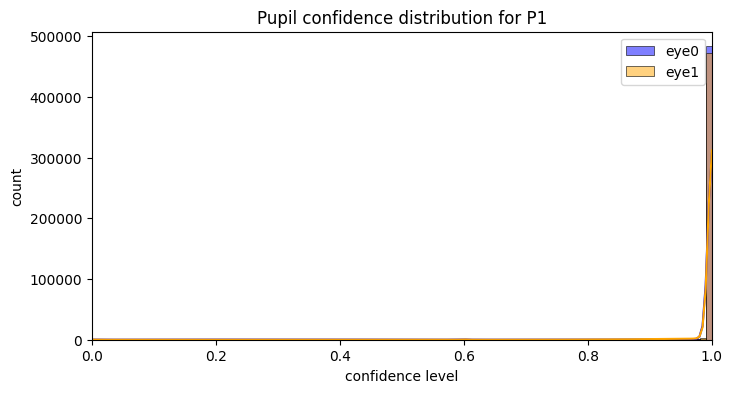

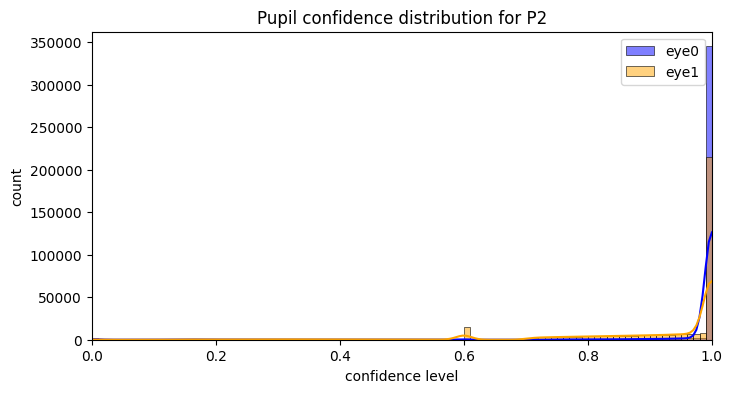

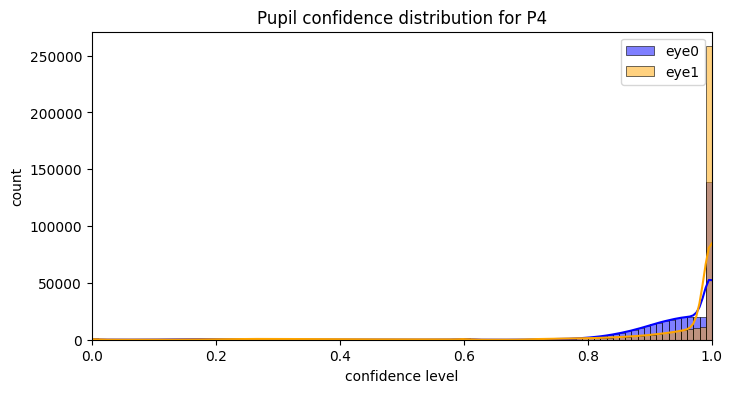

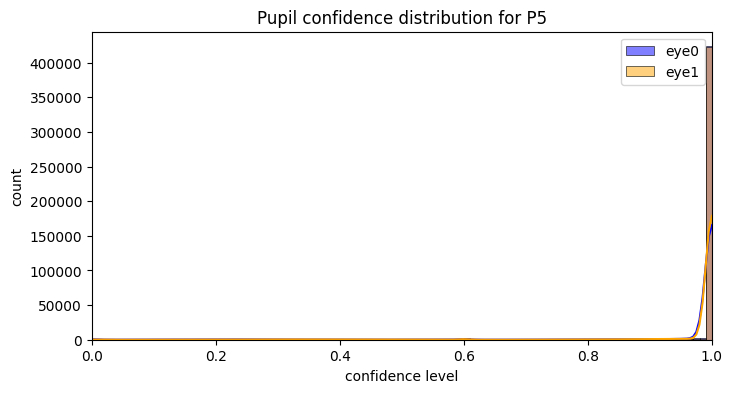

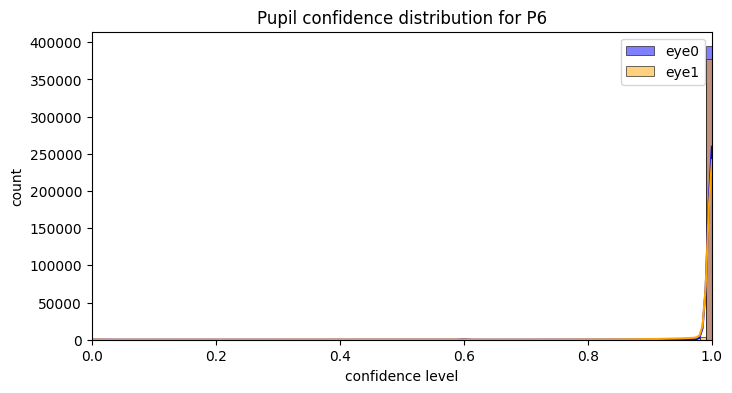

...

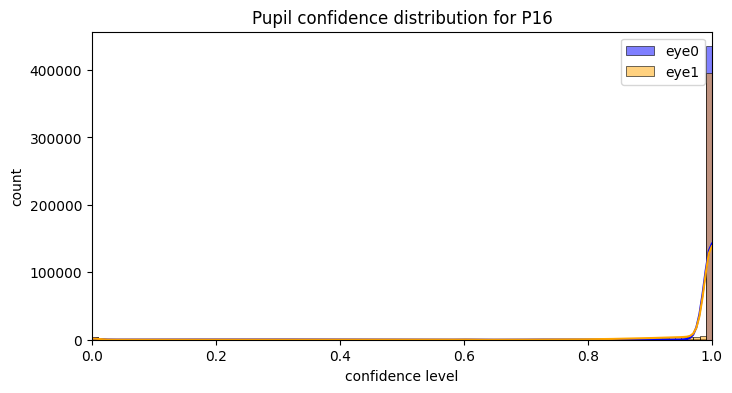

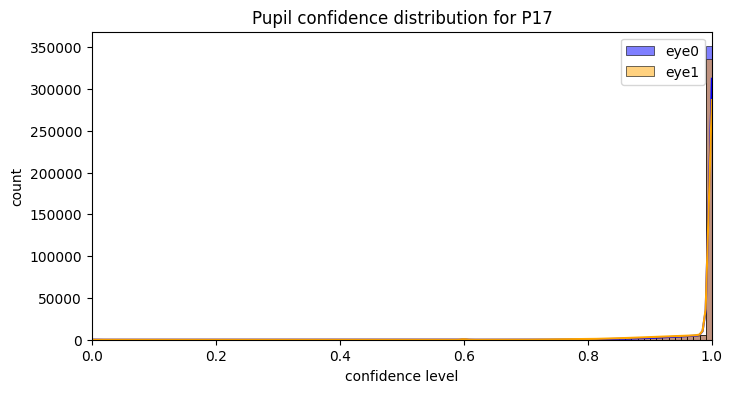

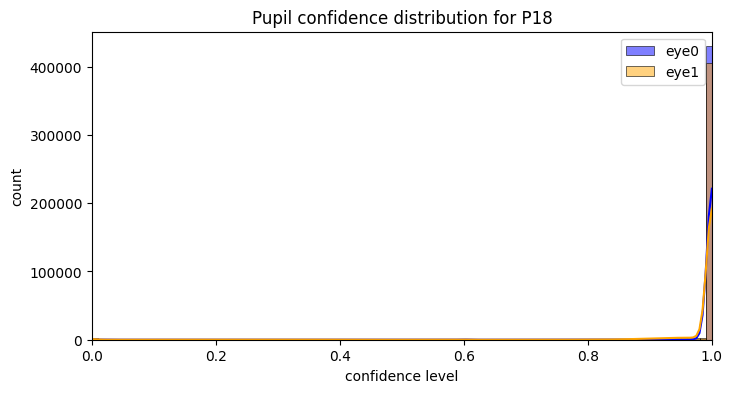

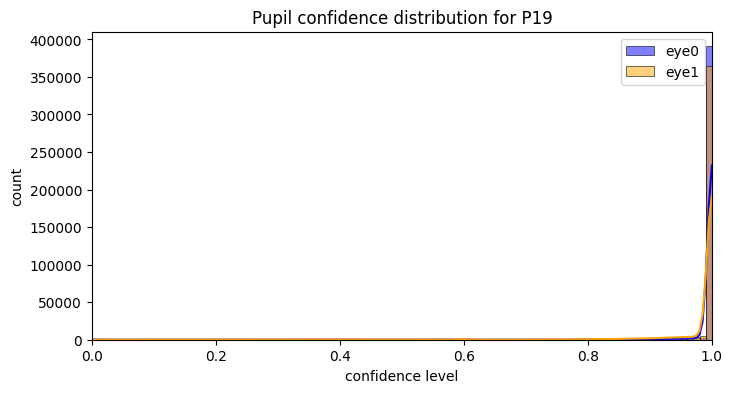

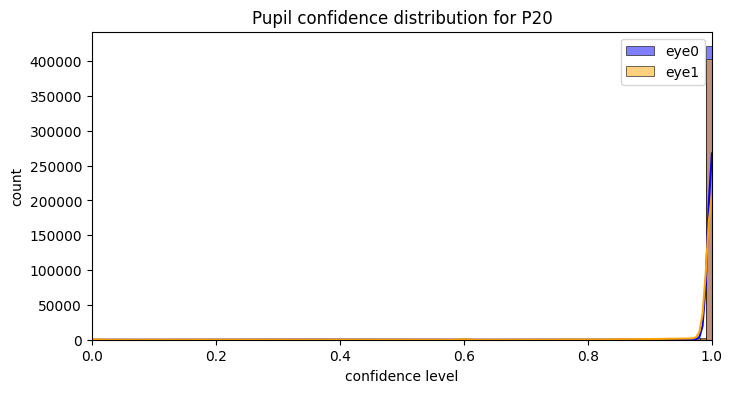

In [ ]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    eye0 = participant_ddf[participant_ddf['eye_id'] == 0]
    eye1 = participant_ddf[participant_ddf['eye_id'] == 1]
    plt.figure(figsize=(8, 4))
    sns.histplot(eye0['confidence'], bins=100, kde=True, color='blue', label='eye0')
    sns.histplot(eye1['confidence'], bins=100, kde=True, color='orange', label='eye1')
    plt.title(f'Pupil confidence distribution for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('count')
    plt.xlim(0,1)
    plt.legend()
    plt.show()

##### Diameter distribution
- Good

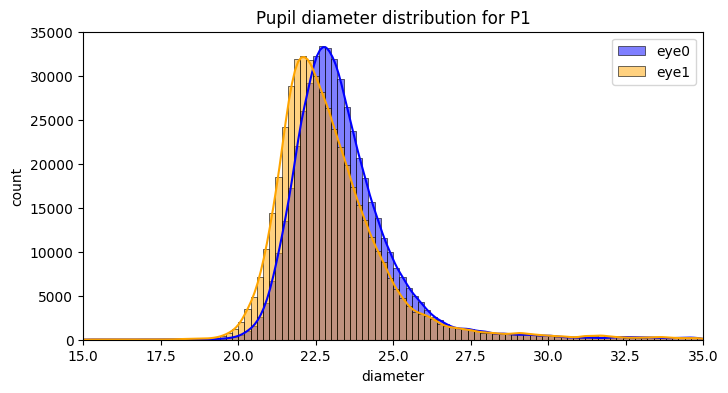

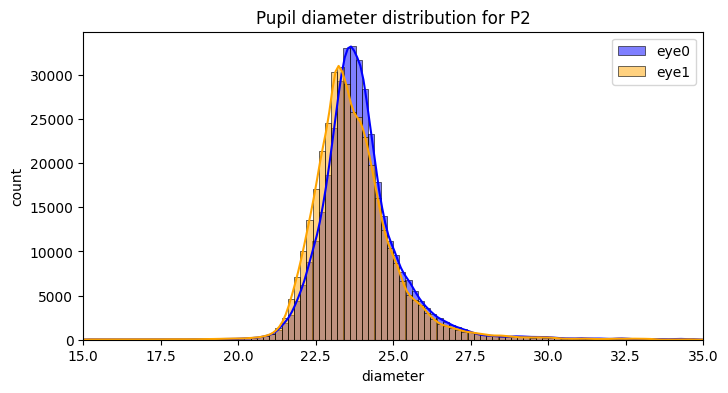

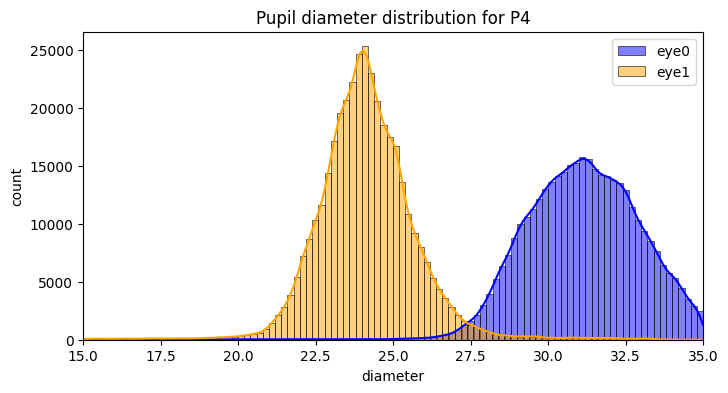

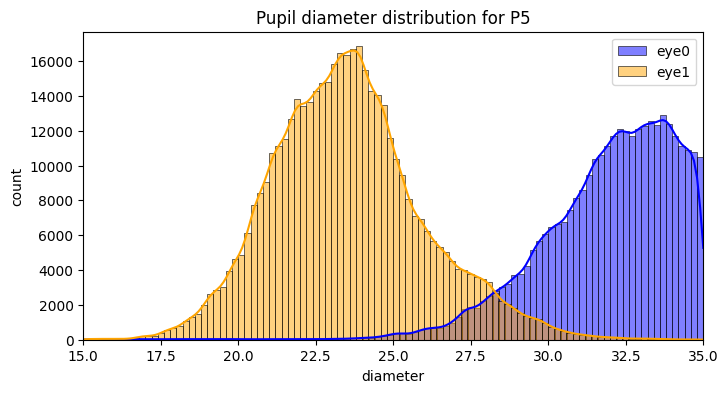

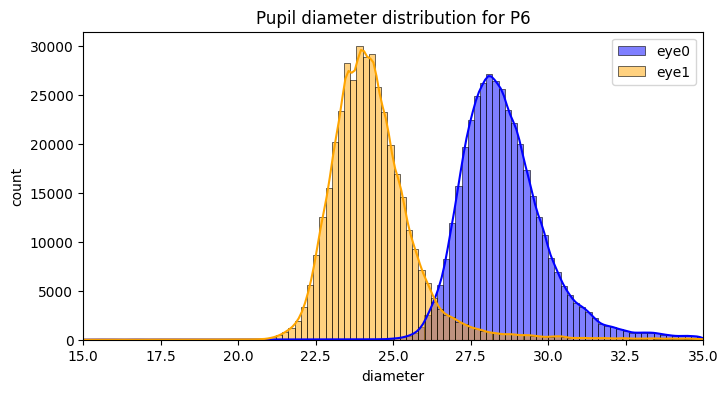

...

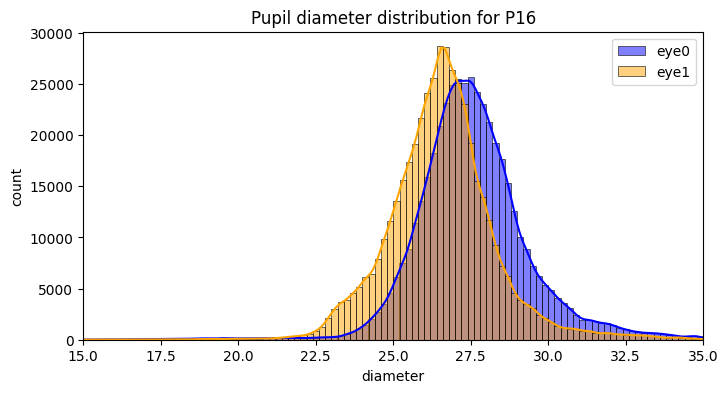

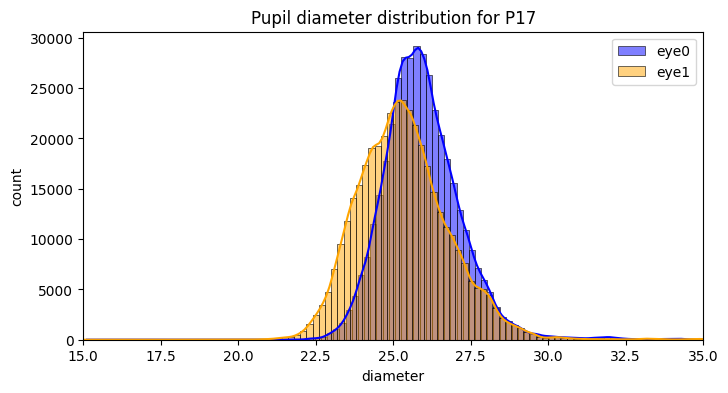

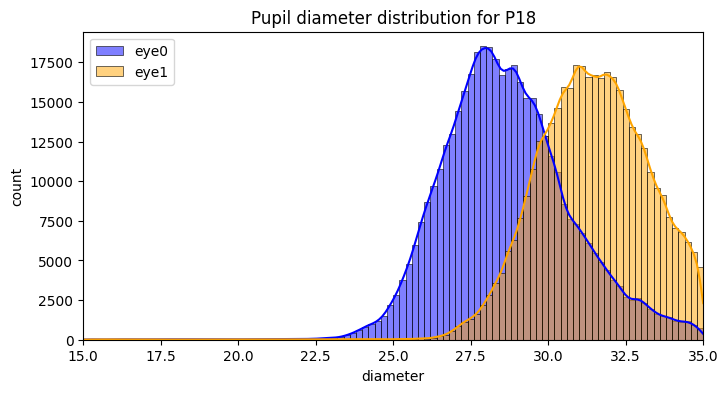

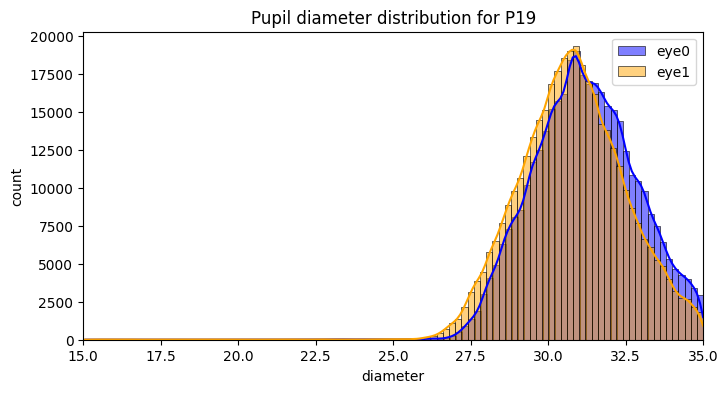

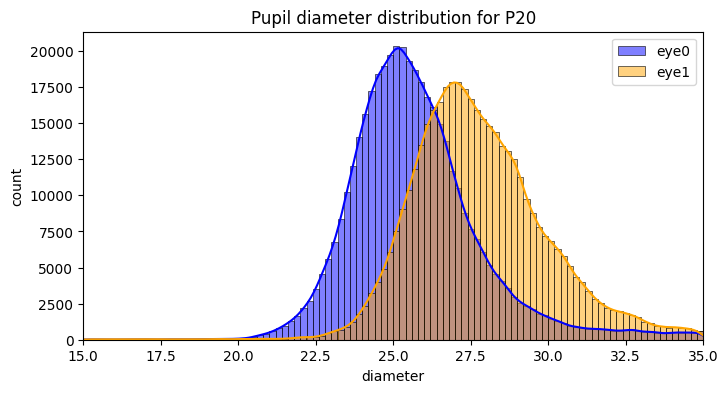

In [ ]:
filtered_eye0 = eye0[(eye0['diameter'] > 15) & (eye0['diameter'] < 35)][['participant_id', 'diameter', 'confidence', 'model_confidence']]
filtered_eye1 = eye1[(eye1['diameter'] > 15) & (eye1['diameter'] < 35)][['participant_id', 'diameter', 'confidence', 'model_confidence']]
for pid in participant_ids:
    participant_eye0 = filtered_eye0[filtered_eye0['participant_id'] == pid]
    participant_eye1 = filtered_eye1[filtered_eye1['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant_eye0['diameter'], bins=100, kde=True, color='blue', label='eye0')
    sns.histplot(participant_eye1['diameter'], bins=100, kde=True, color='orange', label='eye1')
    plt.title(f'Pupil diameter distribution for P{pid}')
    plt.xlabel('diameter')
    plt.ylabel('count')
    plt.xlim(15, 35)
    plt.legend()
    plt.show()

##### Diameter 3d distribution
- Shifted distribution between eye0-eye1 in P4

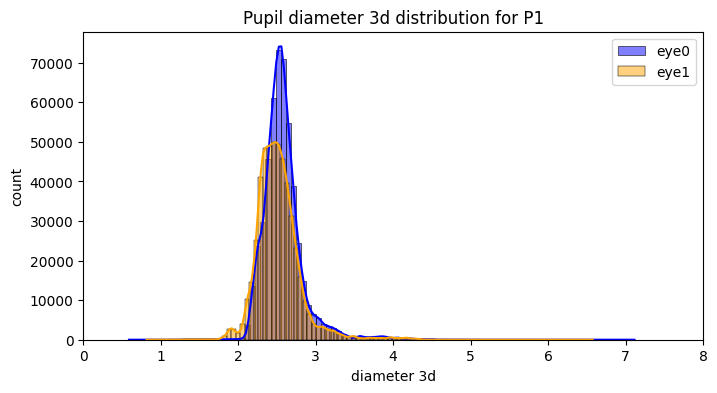

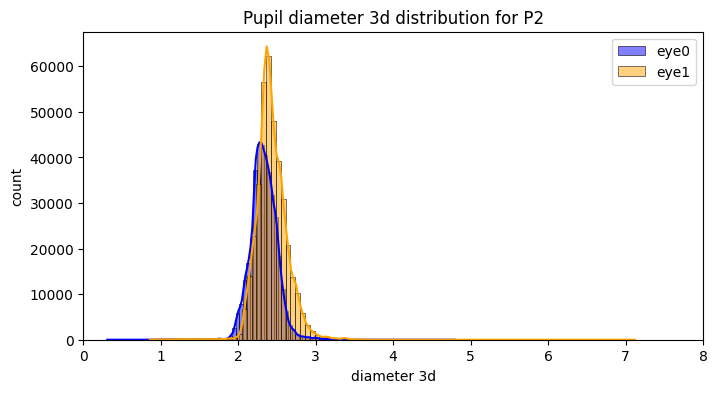

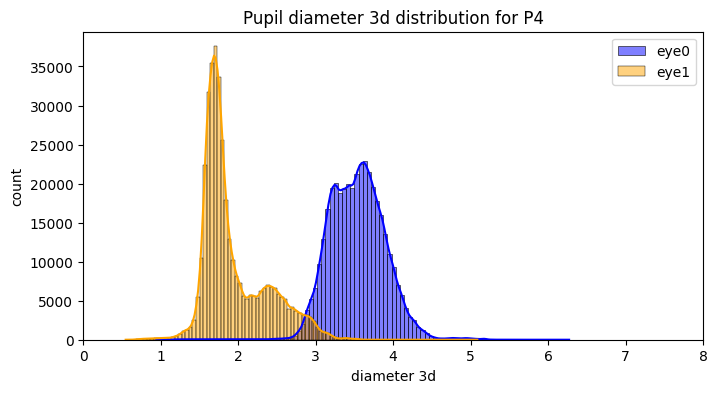

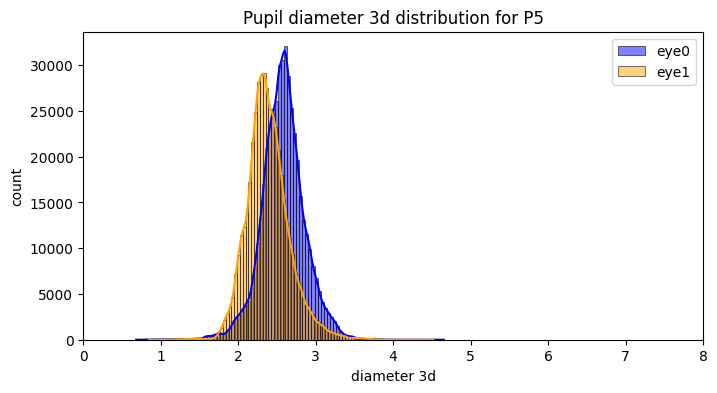

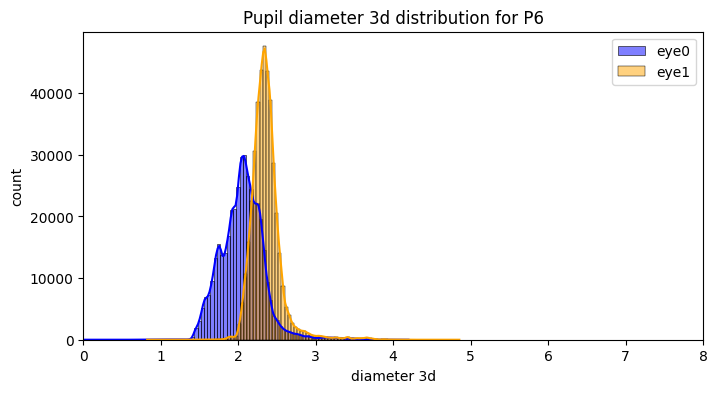

...

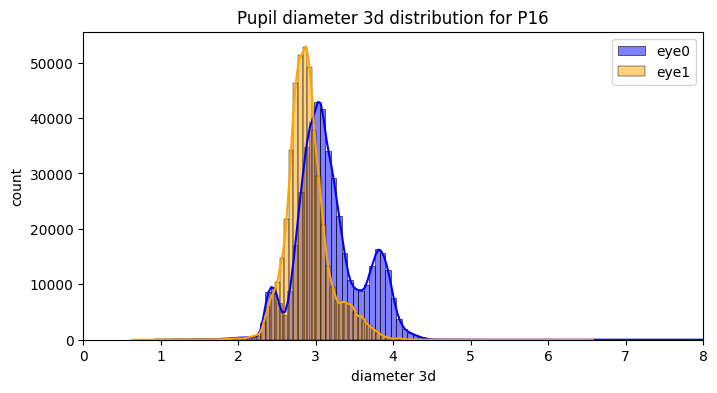

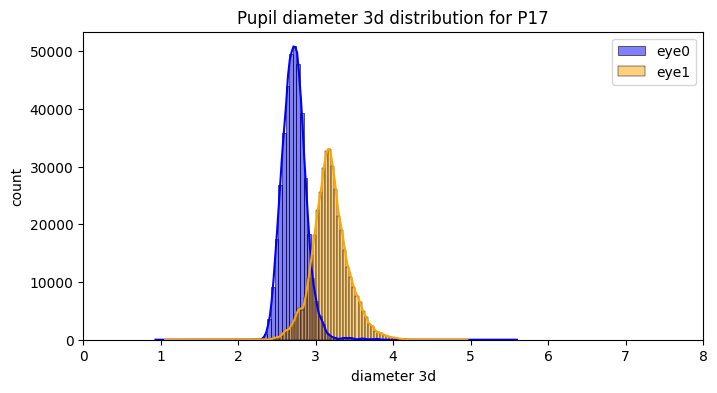

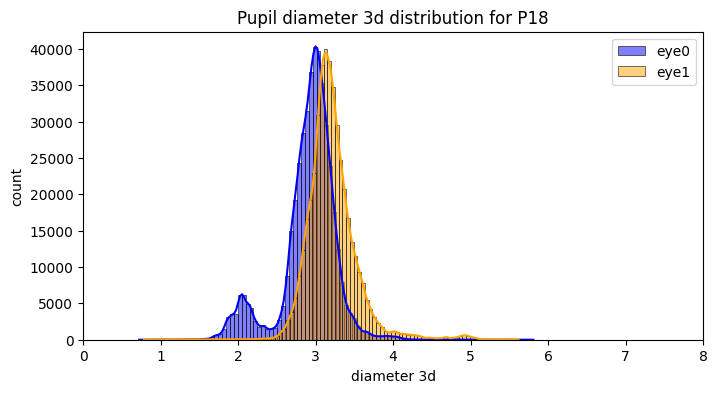

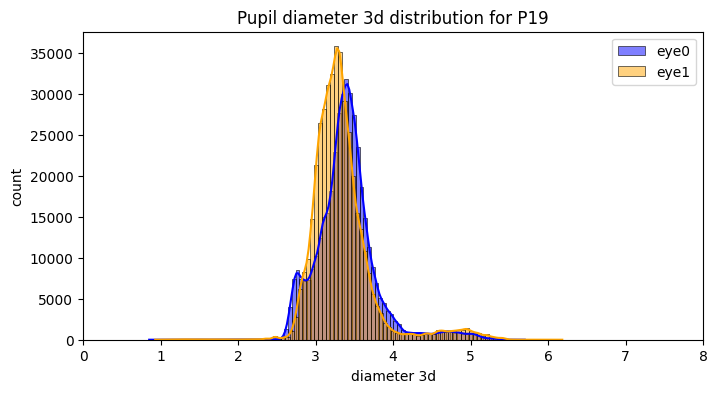

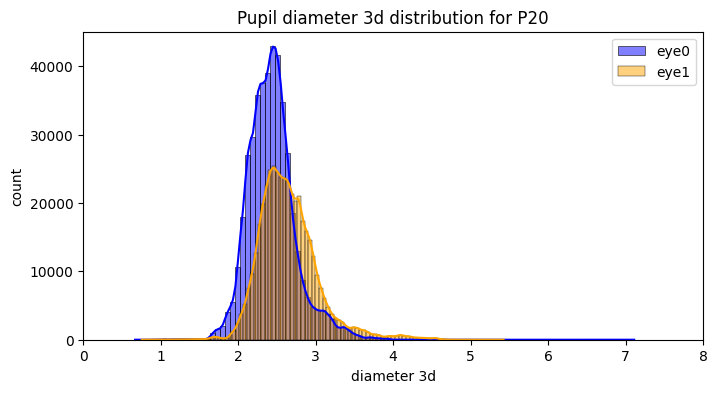

In [ ]:
filtered3d_eye0 = eye0[(eye0['diameter_3d'] > 0) & (eye0['diameter_3d'] < 8)][['participant_id', 'diameter_3d', 'confidence', 'model_confidence']]
filtered3d_eye1 = eye1[(eye1['diameter_3d'] > 0) & (eye1['diameter_3d'] < 8)][['participant_id', 'diameter_3d', 'confidence', 'model_confidence']]
for pid in participant_ids:
    participant3d_eye0 = filtered3d_eye0[filtered3d_eye0['participant_id'] == pid]
    participant3d_eye1 = filtered3d_eye1[filtered3d_eye1['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    sns.histplot(participant3d_eye0['diameter_3d'], bins=100, kde=True, color='blue', label='eye0')
    sns.histplot(participant3d_eye1['diameter_3d'], bins=100, kde=True, color='orange', label='eye1')
    plt.title(f'Pupil diameter 3d distribution for P{pid}')
    plt.xlabel('diameter 3d')
    plt.ylabel('count')
    plt.xlim(0, 8)
    plt.legend()
    plt.show()

##### Model confidence distribution
- Good

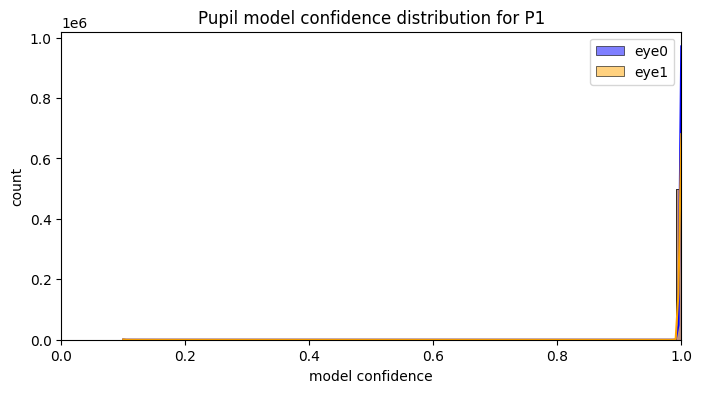

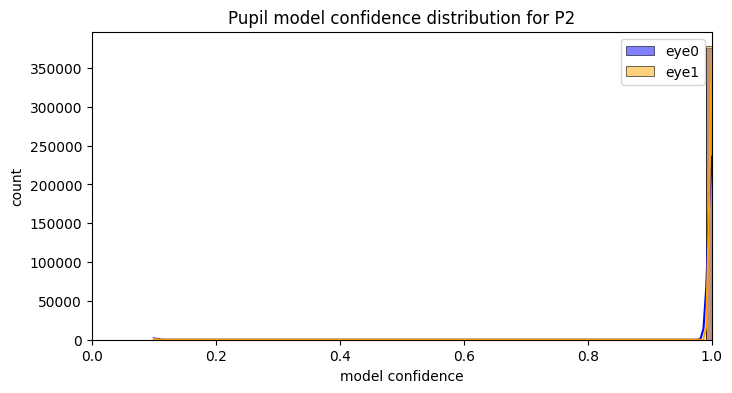

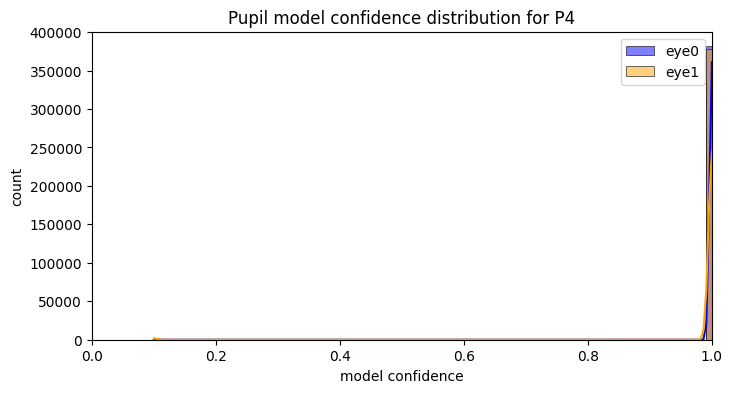

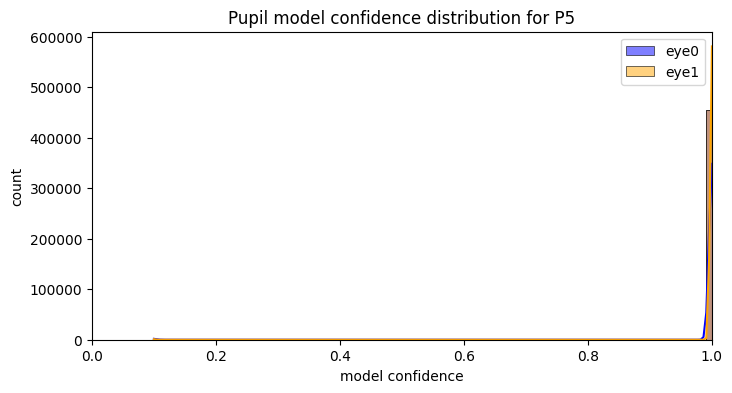

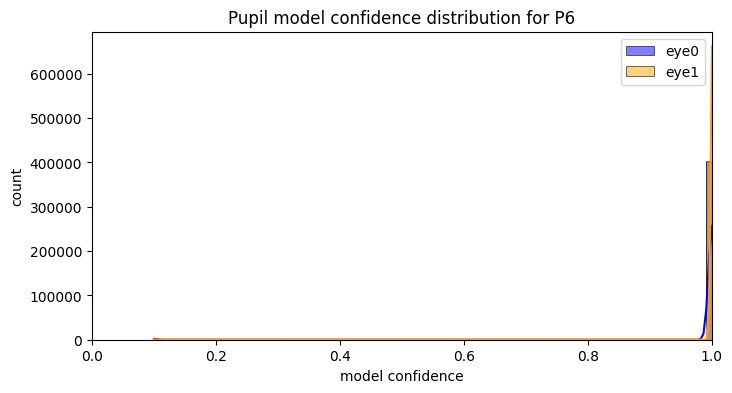

...

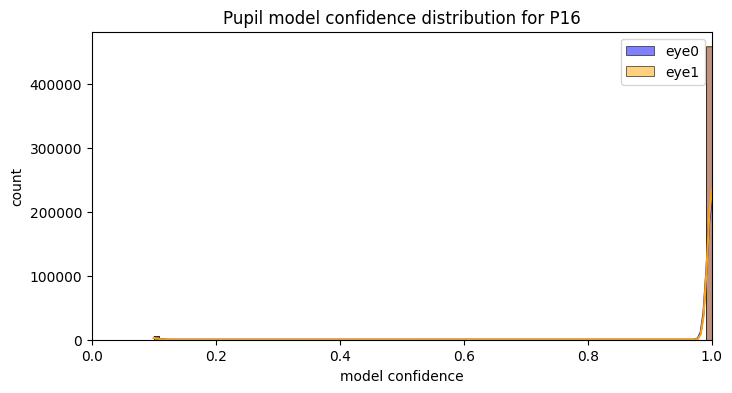

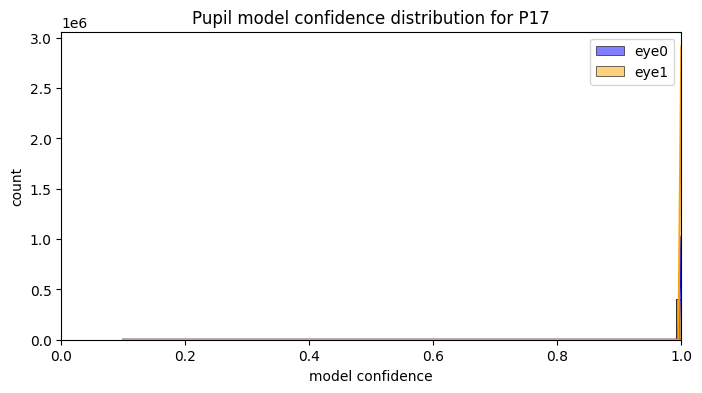

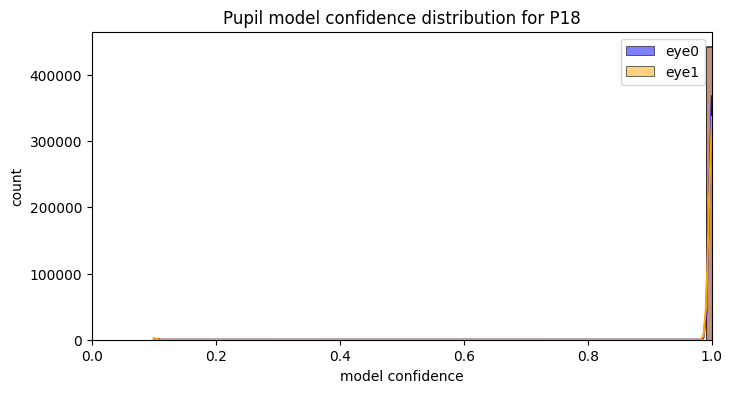

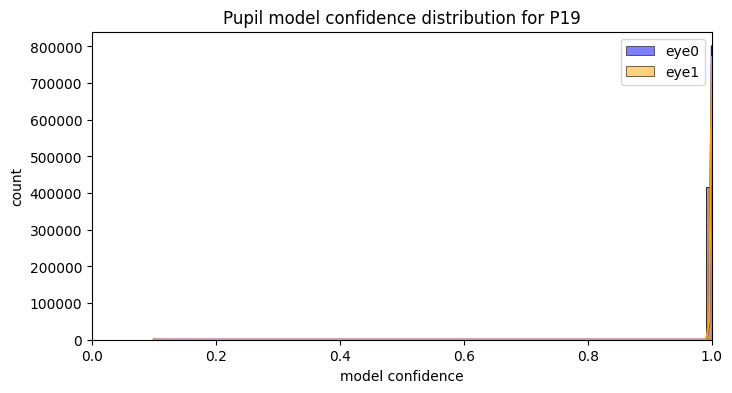

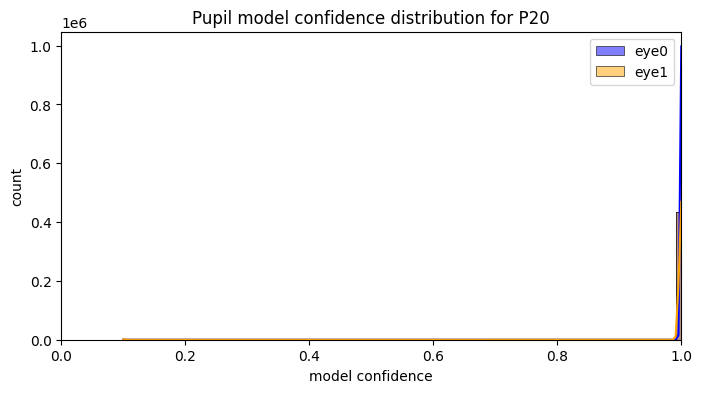

In [ ]:
for pid in participant_ids:
    participant_ddf = ddf[ddf['participant_id'] == pid]
    eye0 = participant_ddf[participant_ddf['eye_id'] == 0]
    eye1 = participant_ddf[participant_ddf['eye_id'] == 1]
    plt.figure(figsize=(8, 4))
    sns.histplot(eye0['model_confidence'], bins=100, kde=True, color='blue', label='eye0')
    sns.histplot(eye1['model_confidence'], bins=100, kde=True, color='orange', label='eye1')
    plt.title(f'Pupil model confidence distribution for P{pid}')
    plt.xlabel('model confidence')
    plt.ylabel('count')
    plt.xlim(0,1)
    plt.legend()
    plt.show()

##### Confidence-diameter correlation
- Weird cut_off between 0.6 and 0.7 of confidence

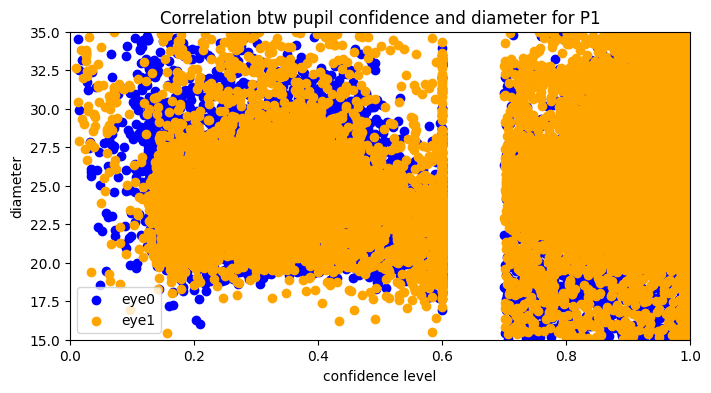

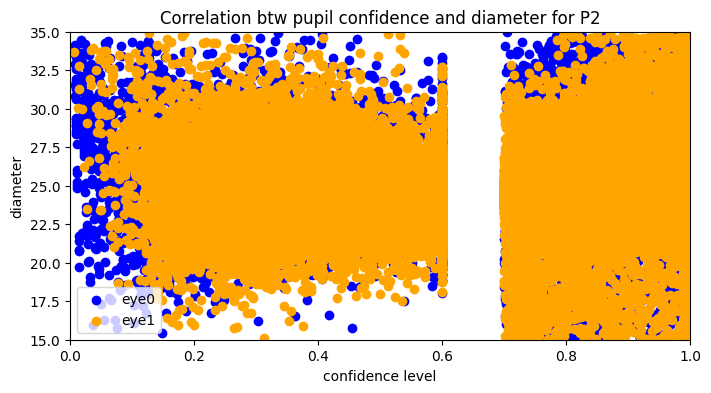

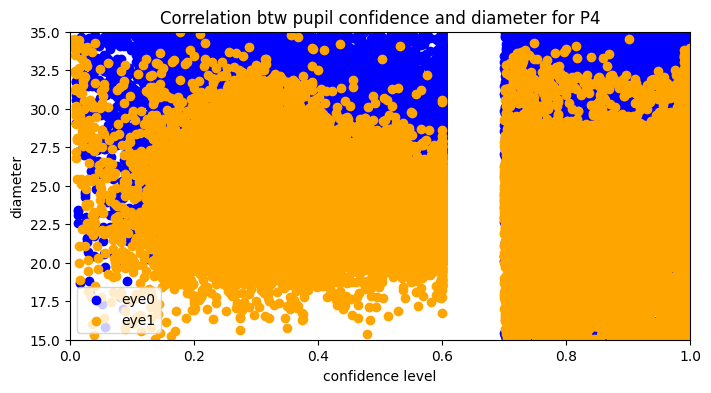

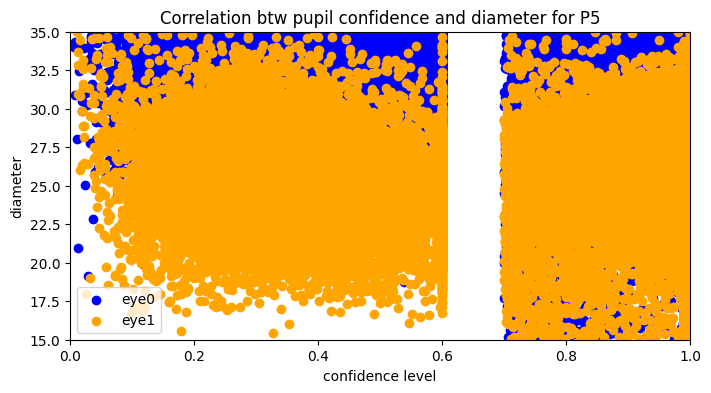

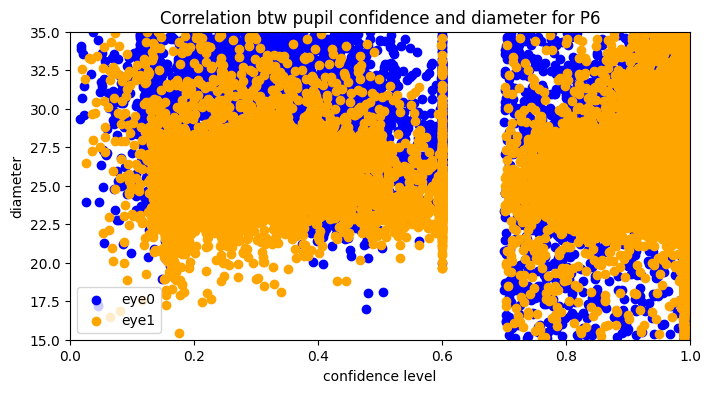

...

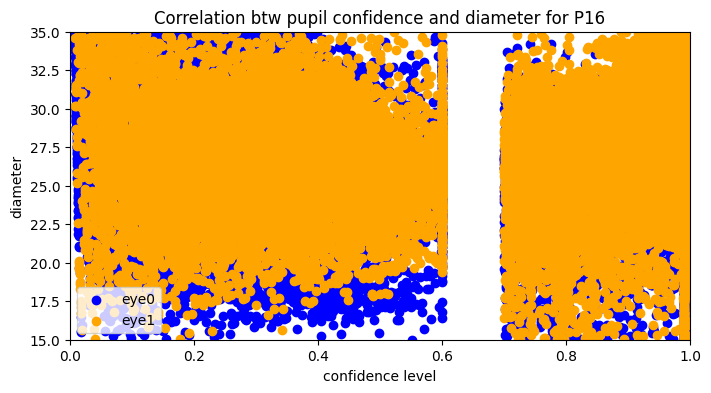

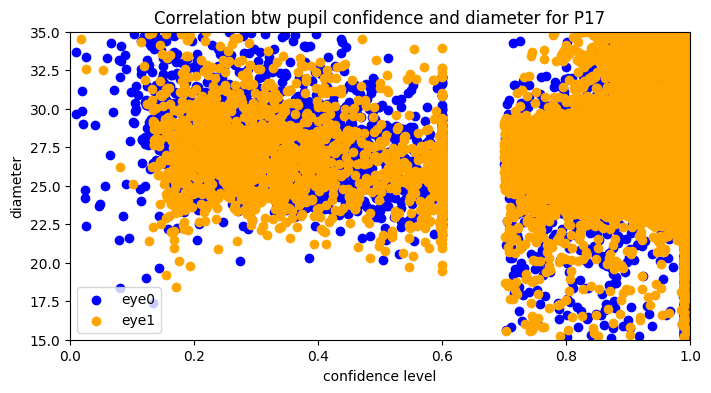

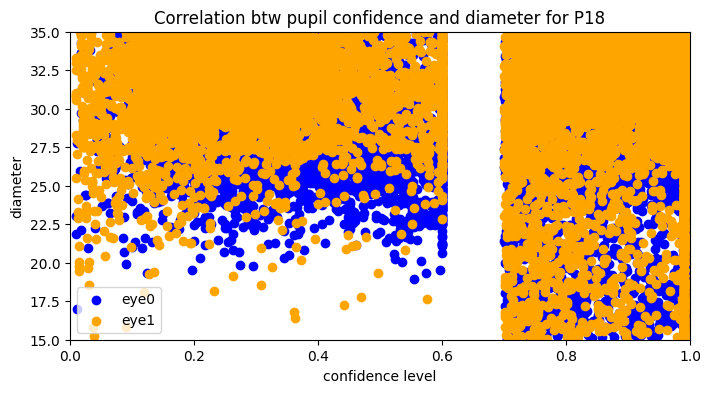

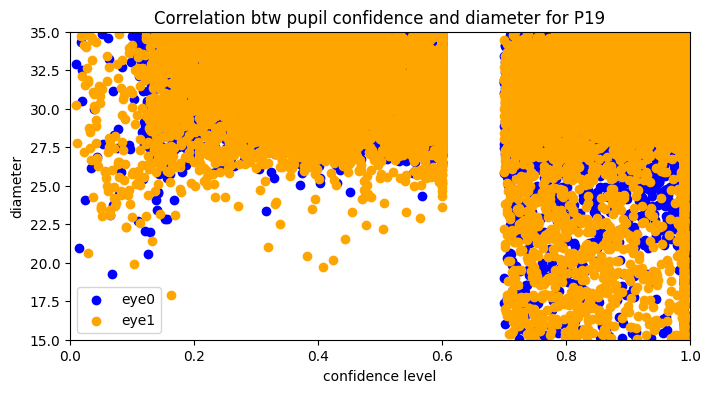

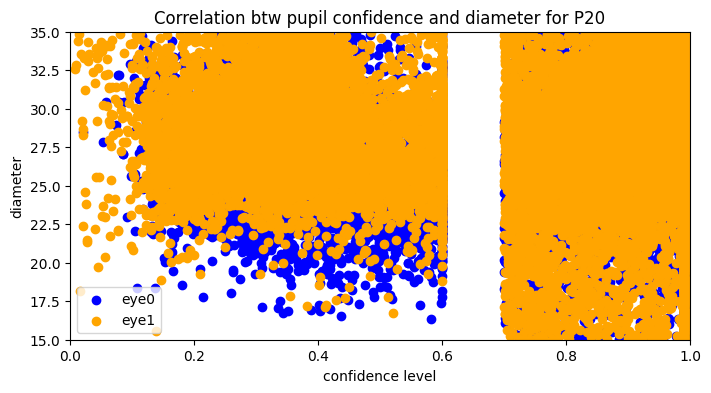

In [ ]:
for pid in participant_ids:
    participant_eye0 = filtered_eye0[filtered_eye0['participant_id'] == pid]
    participant_eye1 = filtered_eye1[filtered_eye1['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_eye0['confidence'], participant_eye0['diameter'], color='blue', label='eye0')
    plt.scatter(participant_eye1['confidence'], participant_eye1['diameter'], color='orange', label='eye1')
    plt.title(f'Correlation btw pupil confidence and diameter for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('diameter')
    plt.xlim(0, 1)
    plt.ylim(15, 35)
    plt.legend(loc='lower left')
    plt.show()

##### Confidence-diameter 3d correlation
- Weird cut_off between 0.6 and 0.7 of confidence

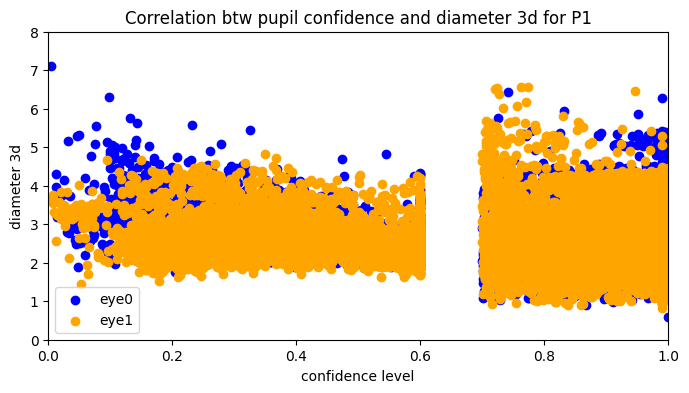

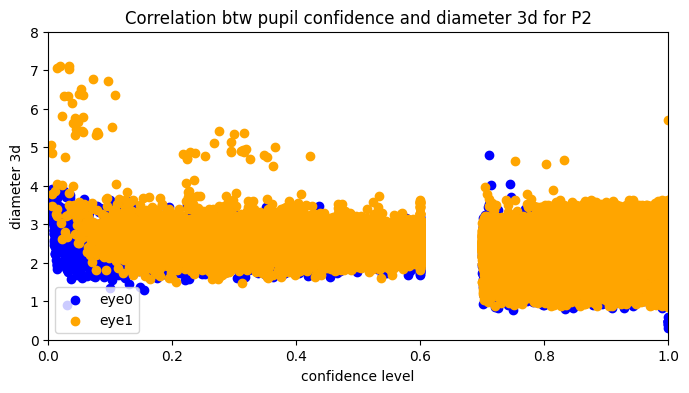

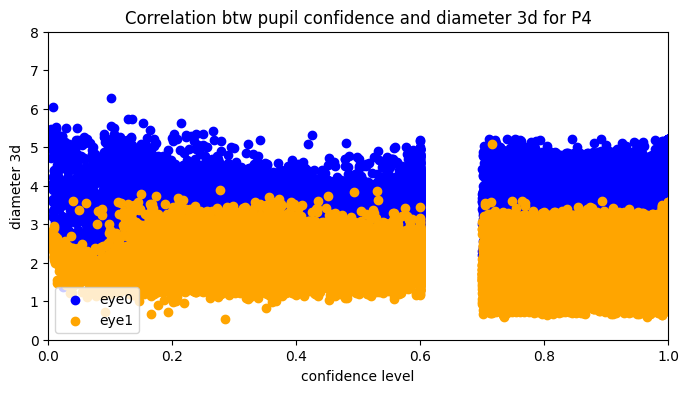

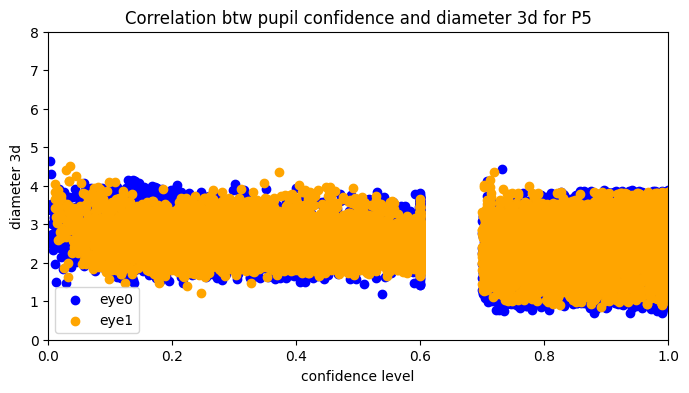

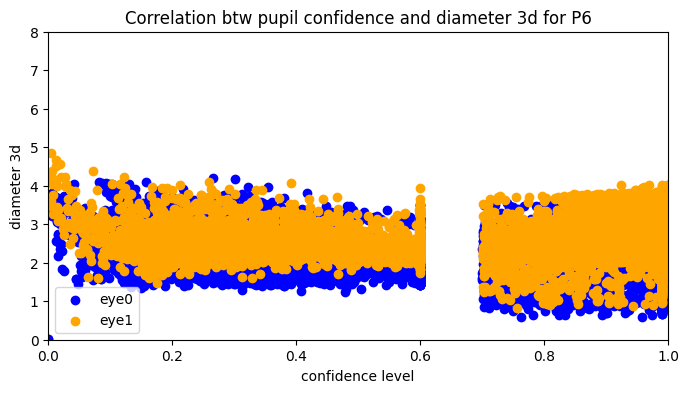

...

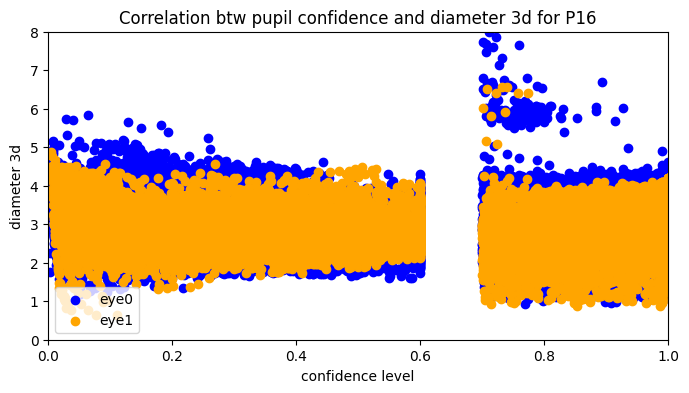

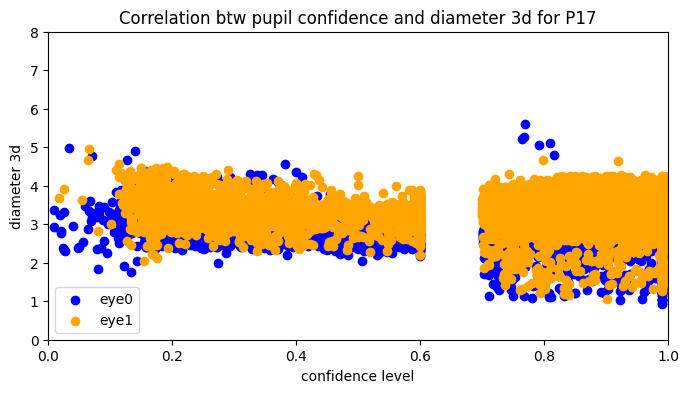

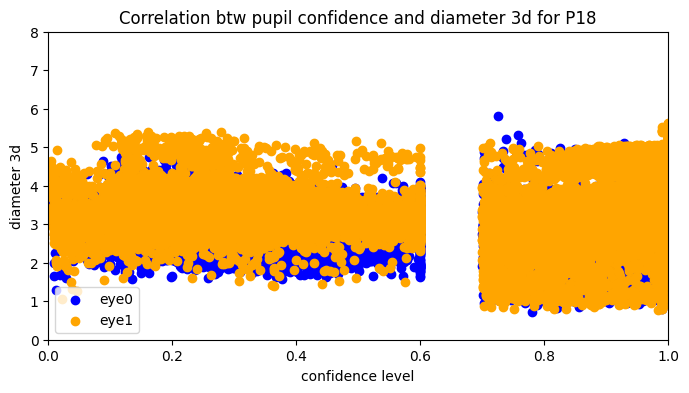

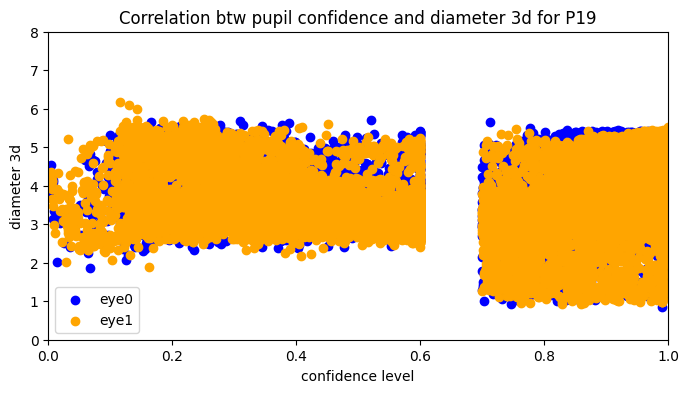

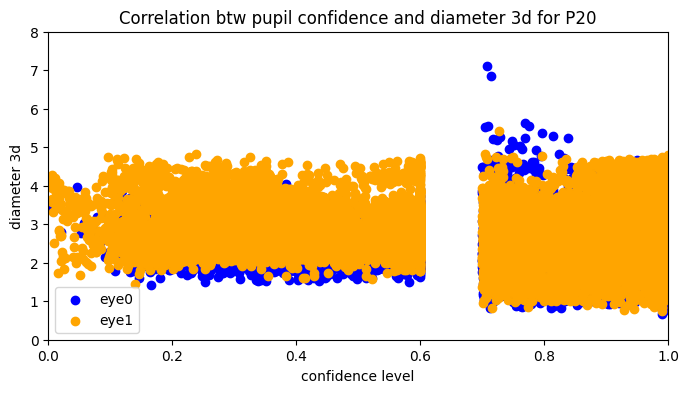

In [ ]:
for pid in participant_ids:
    participant3d_eye0 = filtered3d_eye0[filtered3d_eye0['participant_id'] == pid]
    participant3d_eye1 = filtered3d_eye1[filtered3d_eye1['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant3d_eye0['confidence'], participant3d_eye0['diameter_3d'], color='blue', label='eye0')
    plt.scatter(participant3d_eye1['confidence'], participant3d_eye1['diameter_3d'], color='orange', label='eye1')
    plt.title(f'Correlation btw pupil confidence and diameter 3d for P{pid}')
    plt.xlabel('confidence level')
    plt.ylabel('diameter 3d')
    plt.xlim(0, 1)
    plt.ylim(0, 8)
    plt.legend(loc='lower left')
    plt.show()

##### Model confidence-diameter 3d correlation

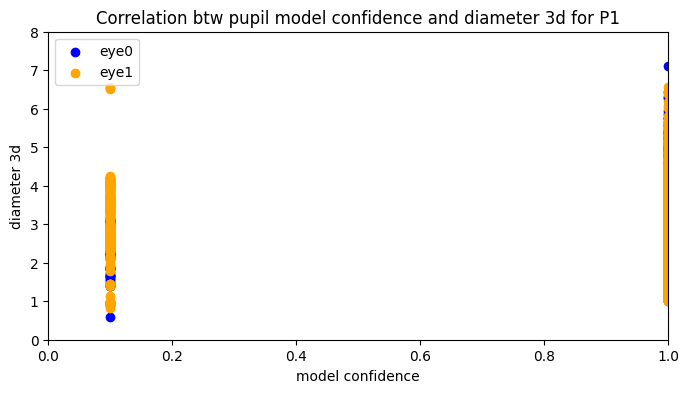

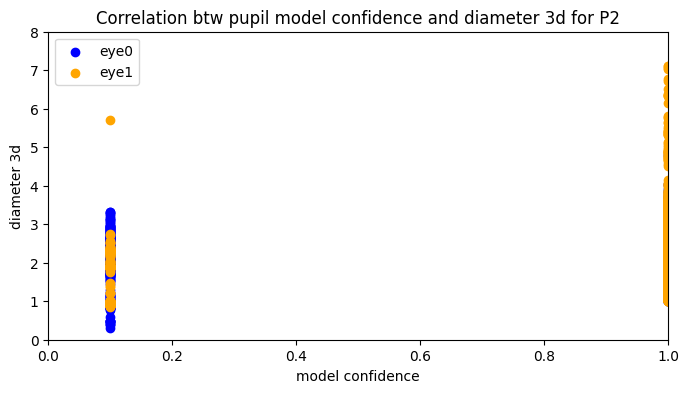

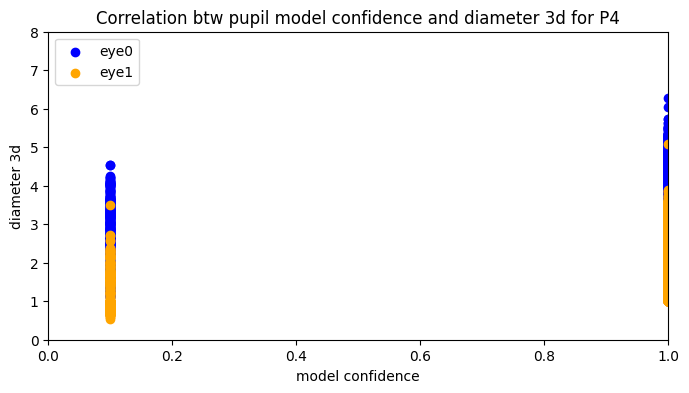

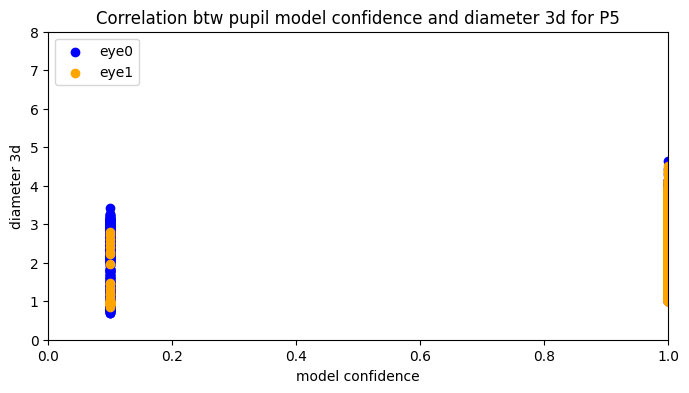

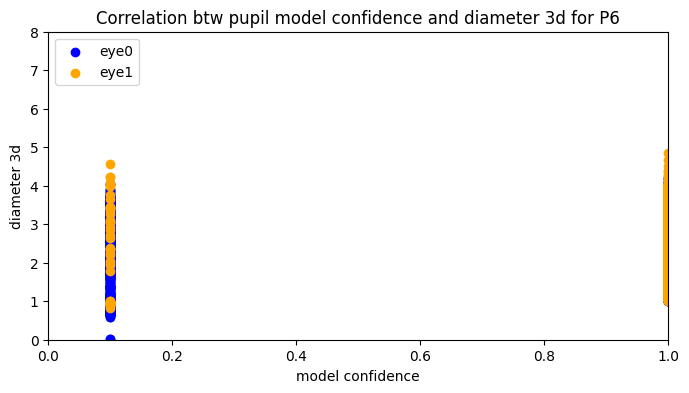

...

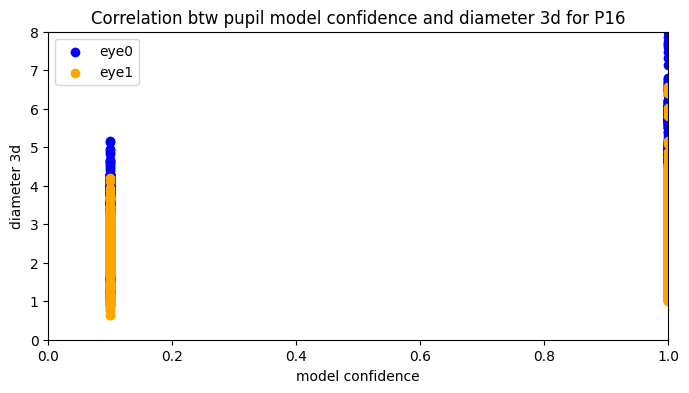

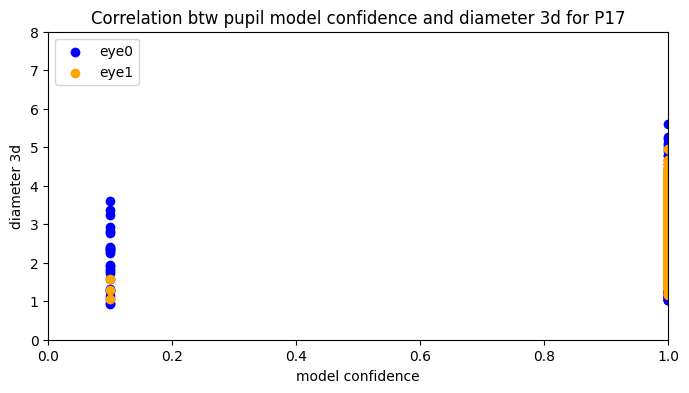

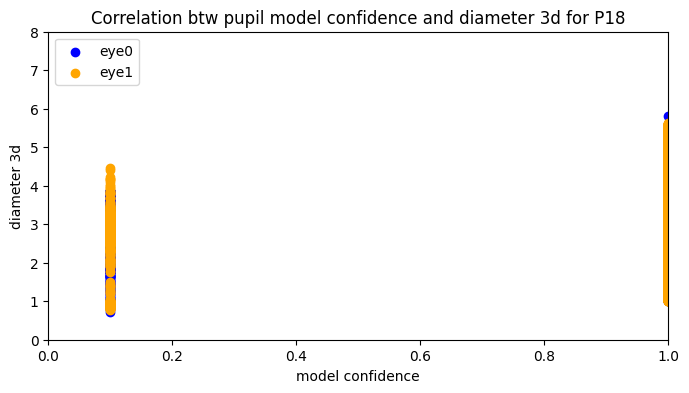

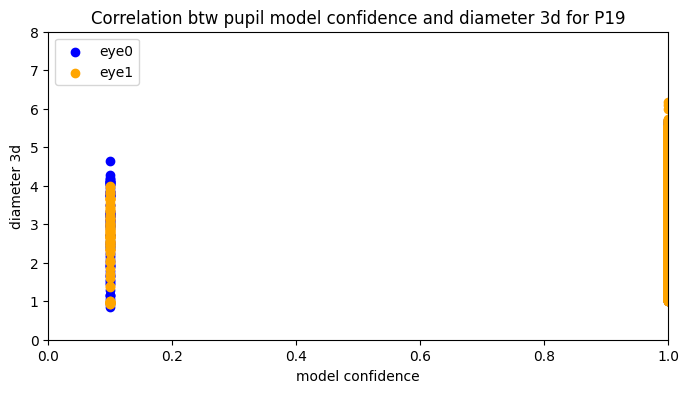

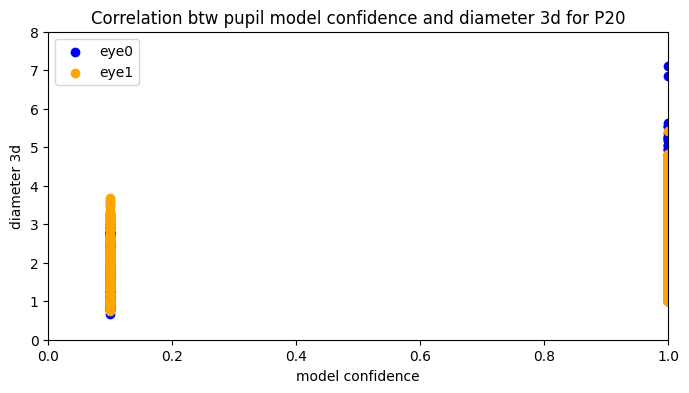

In [ ]:
for pid in participant_ids:
    participant3d_eye0 = filtered3d_eye0[filtered3d_eye0['participant_id'] == pid]
    participant3d_eye1 = filtered3d_eye1[filtered3d_eye1['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant3d_eye0['model_confidence'], participant3d_eye0['diameter_3d'], color='blue', label='eye0')
    plt.scatter(participant3d_eye1['model_confidence'], participant3d_eye1['diameter_3d'], color='orange', label='eye1')
    plt.title(f'Correlation btw pupil model confidence and diameter 3d for P{pid}')
    plt.xlabel('model confidence')
    plt.ylabel('diameter 3d')
    plt.xlim(0, 1)
    plt.ylim(0, 8)
    plt.legend(loc='upper left')
    plt.show()

##### Diameter-diameter 3d correlation
- Sometimes eye 0 and eye 1 correlations are not exactly parallel (P5, P6, P9, P10, P11))

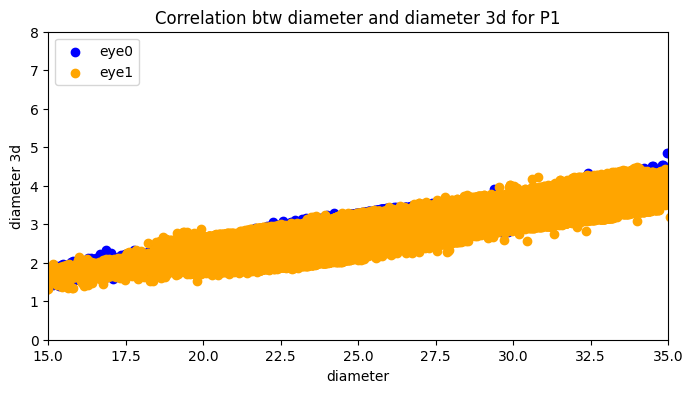

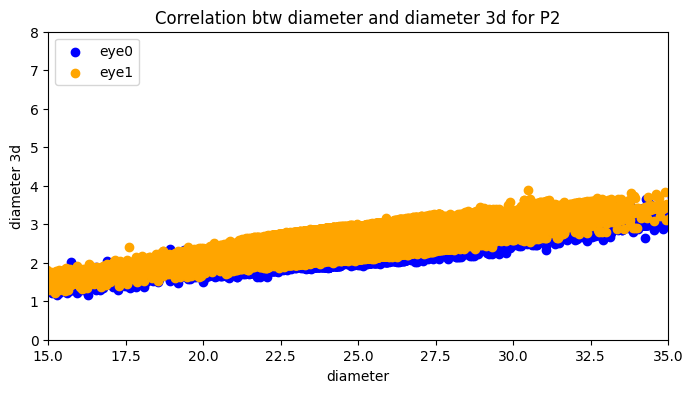

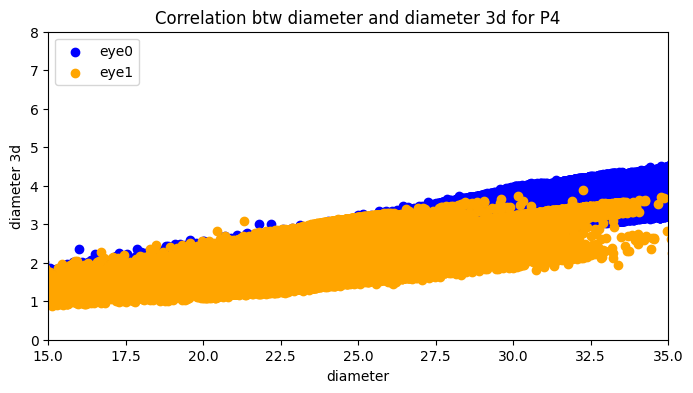

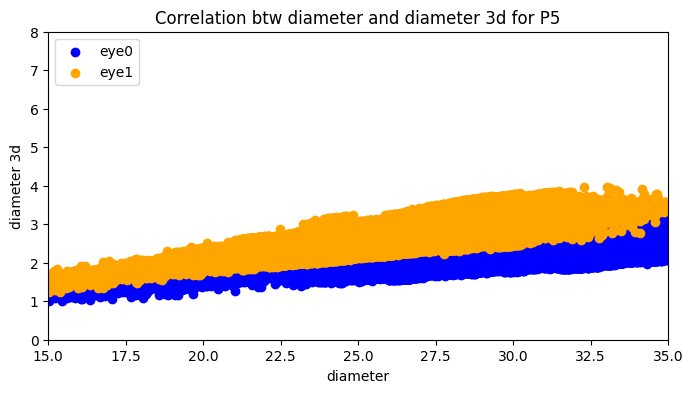

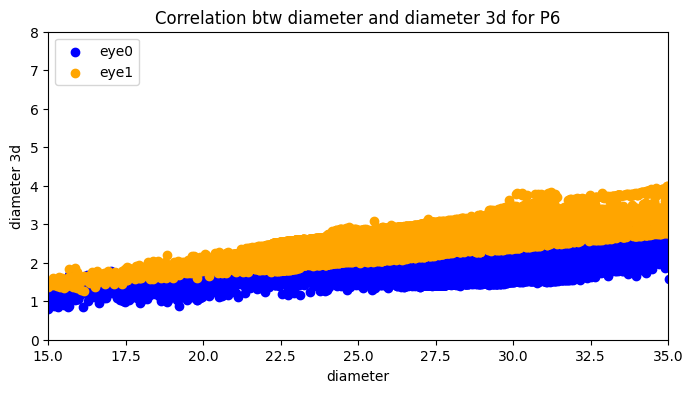

...

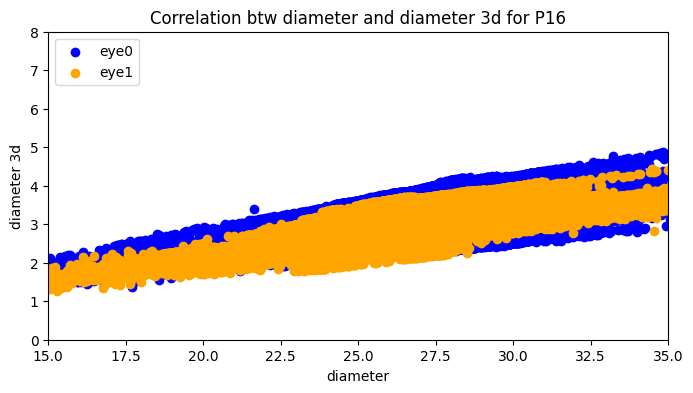

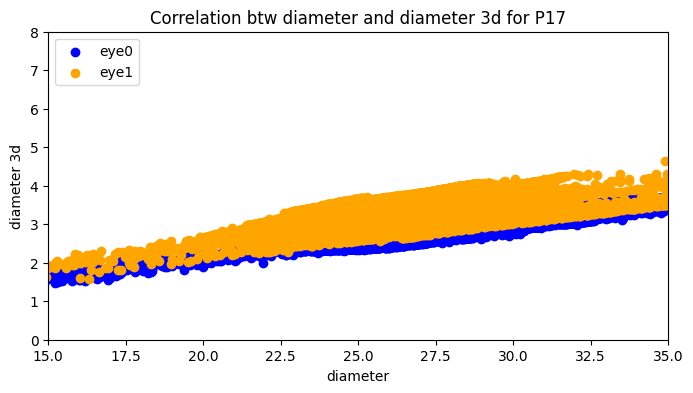

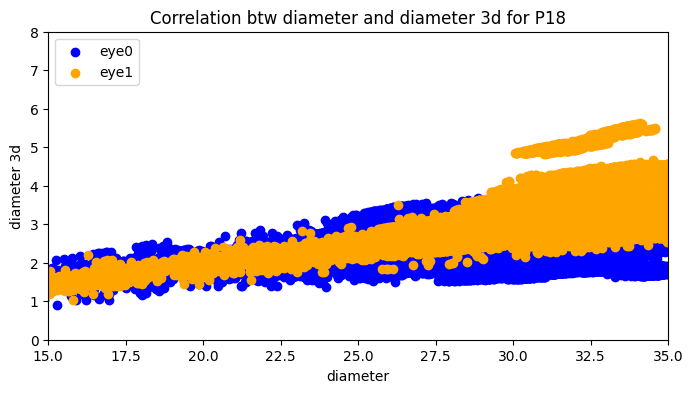

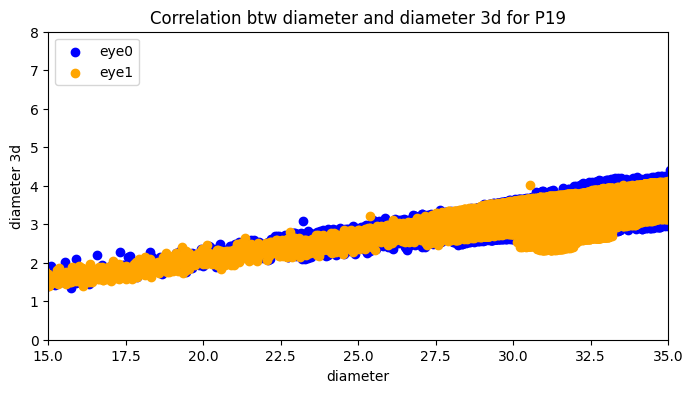

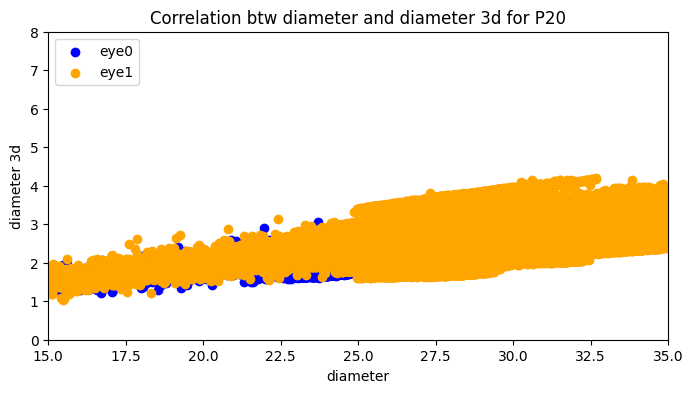

In [ ]:
filtered_diam_eye0 = eye0[((eye0['diameter'] > 15) & (eye0['diameter'] < 35)) | ((eye0['diameter_3d'] > 0) & (eye0['diameter_3d'] < 8))][['participant_id', 'diameter', 'diameter_3d']]
filtered_diam_eye1 = eye1[((eye1['diameter'] > 15) & (eye1['diameter'] < 35)) | ((eye1['diameter_3d'] > 0) & (eye1['diameter_3d'] < 8))][['participant_id', 'diameter', 'diameter_3d']]
for pid in participant_ids:
    participant_eye0 = filtered_diam_eye0[filtered_diam_eye0['participant_id'] == pid]
    participant_eye1 = filtered_diam_eye1[filtered_diam_eye1['participant_id'] == pid]
    plt.figure(figsize=(8, 4))
    plt.scatter(participant_eye0['diameter'], participant_eye0['diameter_3d'], color='blue', label='eye0')
    plt.scatter(participant_eye1['diameter'], participant_eye1['diameter_3d'], color='orange', label='eye1')
    plt.title(f'Correlation btw diameter and diameter 3d for P{pid}')
    plt.xlabel('diameter')
    plt.ylabel('diameter 3d')
    plt.xlim(15, 35)
    plt.ylim(0, 8)
    plt.legend(loc='upper left')
    plt.show()

##### Diameter boxplot
- Considerable differences between eye0 and eye1 (P4, P5, P6, P7, P8, P9, P10, P11, P18)

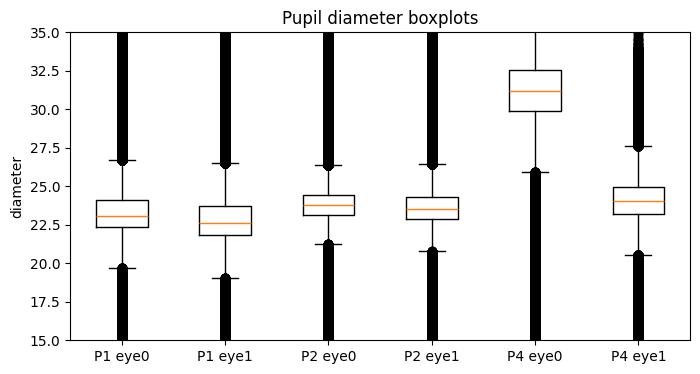

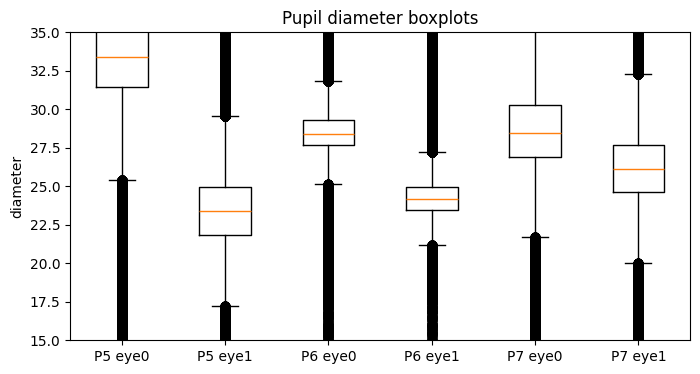

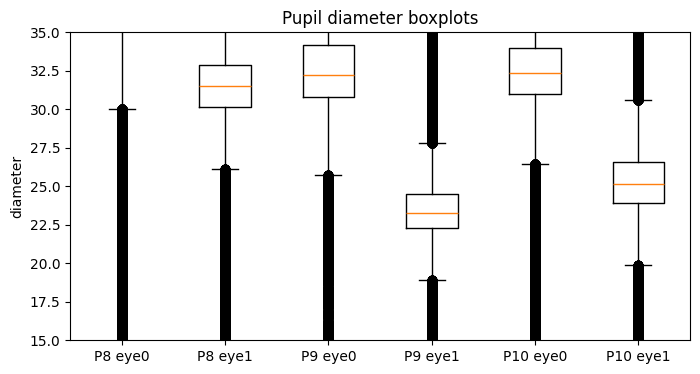

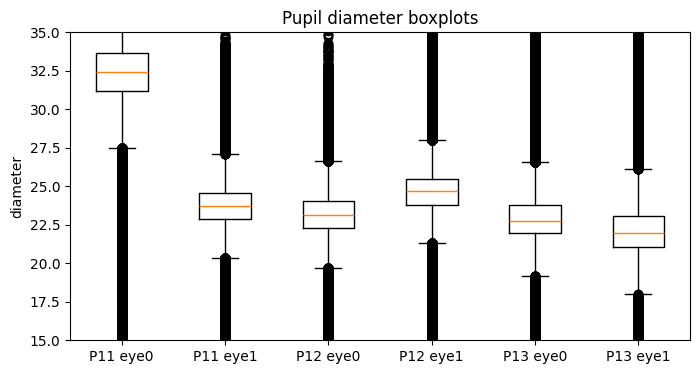

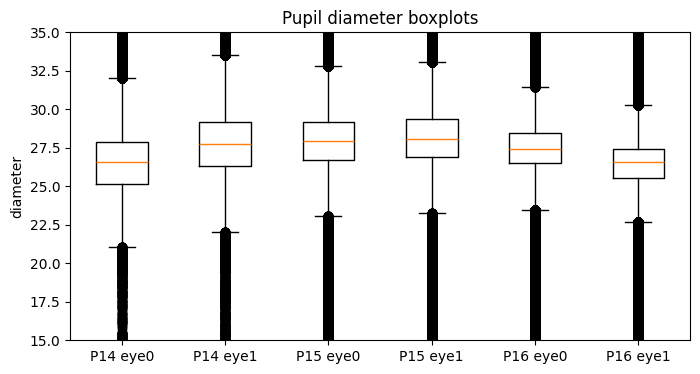

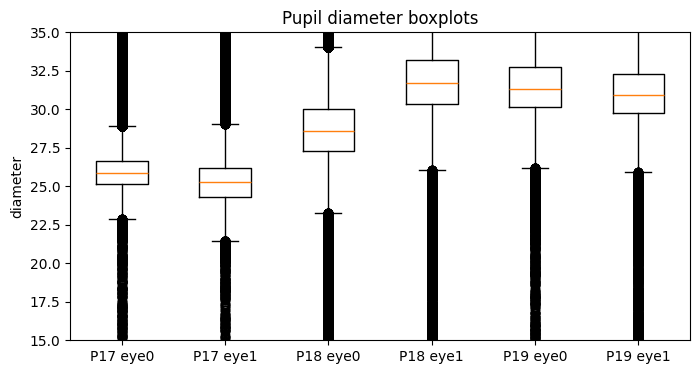

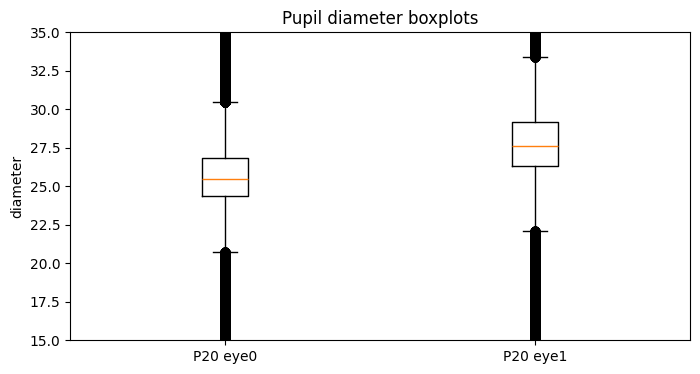

In [ ]:
grouped_ids = [participant_ids[i:i+3] for i in range(0, len(participant_ids), 3)] #group ids
for group in grouped_ids: #iterate groups
    eyes_ddf = []
    labels = []
    for pid in group:
        participant_eye0 = eye0[eye0['participant_id'] == pid]['diameter']
        participant_eye1 = eye1[eye1['participant_id'] == pid]['diameter']
        eyes_ddf.append(participant_eye0)
        eyes_ddf.append(participant_eye1)
        labels.append(f'P{pid} eye0')
        labels.append(f'P{pid} eye1')
    plt.figure(figsize=(8, 4))
    plt.boxplot(eyes_ddf, whis = 1.5)
    plt.title(f'Pupil diameter boxplots')
    plt.ylabel('diameter')
    plt.xticks(range(1, len(labels) + 1), labels)
    plt.ylim(15, 35)
    plt.show()

##### Diameter 3d boxplot
- Considerable (smaller) differences between eye0 and eye1 (only P4)
- Diameter 3d as potentially more raliable than diameter

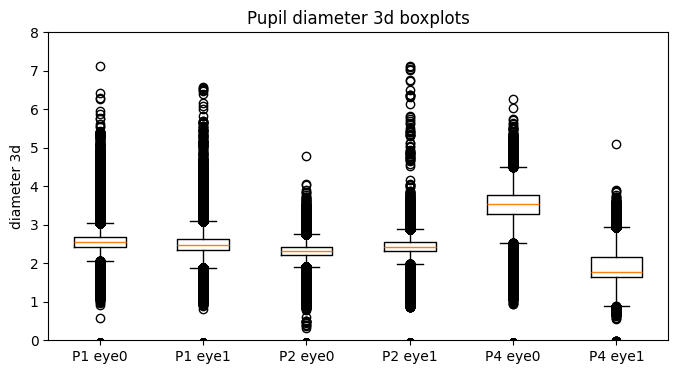

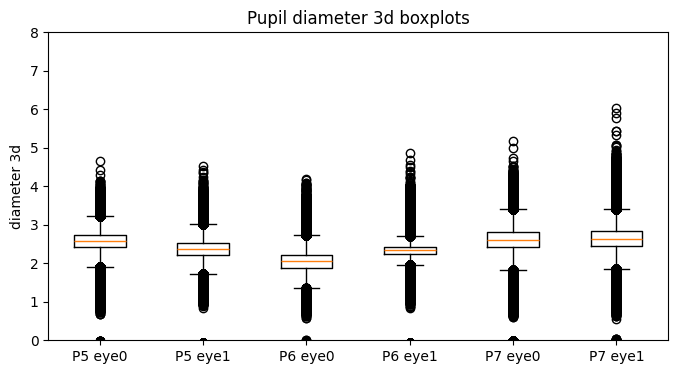

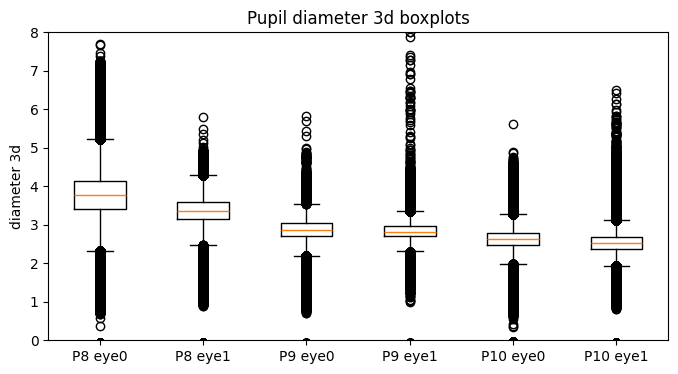

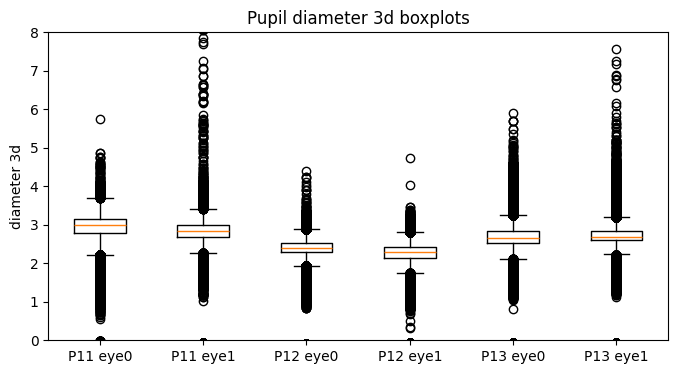

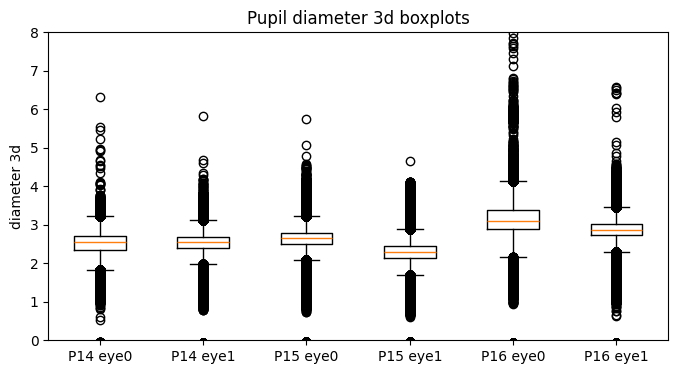

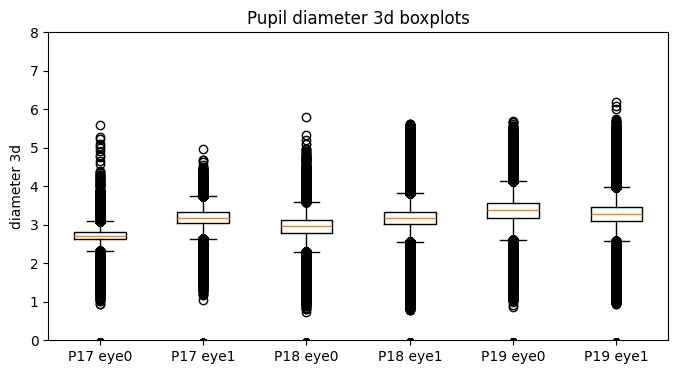

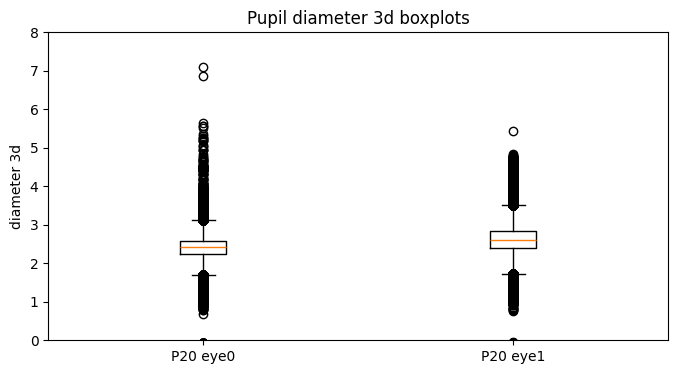

In [ ]:
grouped_ids = [participant_ids[i:i+3] for i in range(0, len(participant_ids), 3)] #group ids
for group in grouped_ids: #iterate groups
    eyes_ddf = []
    labels = []
    for pid in group:
        participant_eye0 = eye0[eye0['participant_id'] == pid]['diameter_3d']
        participant_eye1 = eye1[eye1['participant_id'] == pid]['diameter_3d']
        eyes_ddf.append(participant_eye0)
        eyes_ddf.append(participant_eye1)
        labels.append(f'P{pid} eye0')
        labels.append(f'P{pid} eye1')
    plt.figure(figsize=(8, 4))
    plt.boxplot(eyes_ddf, whis = 1.5)
    plt.title(f'Pupil diameter 3d boxplots')
    plt.ylabel('diameter 3d')
    plt.xticks(range(1, len(labels) + 1), labels)
    plt.ylim(0, 8)
    plt.show()

### 3. Time-Series Assessment
Confidence, Diameter 3d

##### Confidence over time
- Confidence flactuates a lot, often to 0 for some participants (P4, P8, P12, P15)

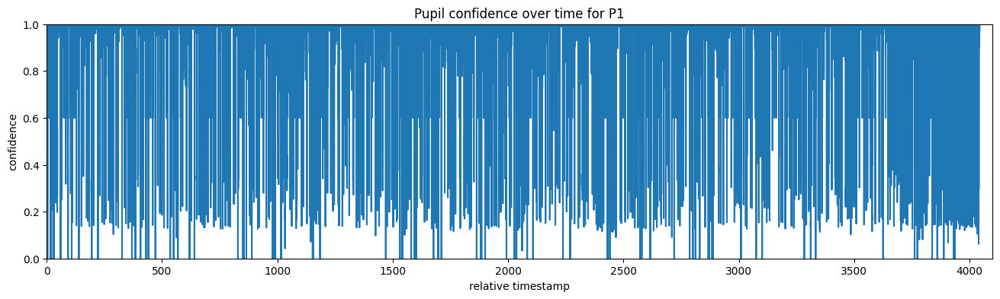

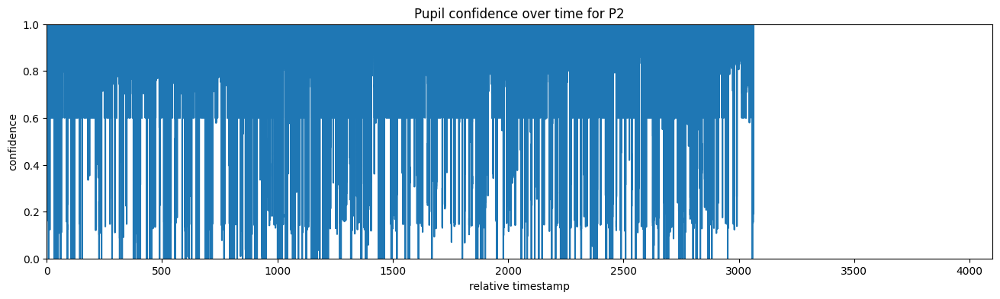

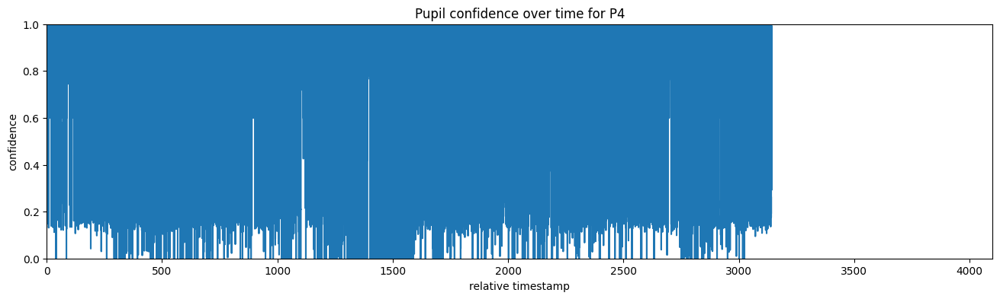

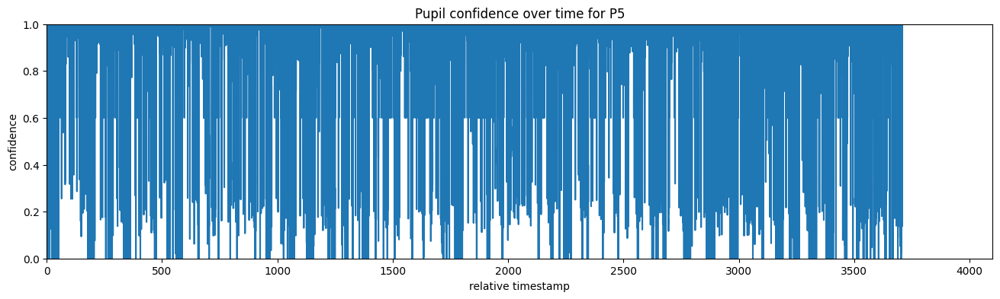

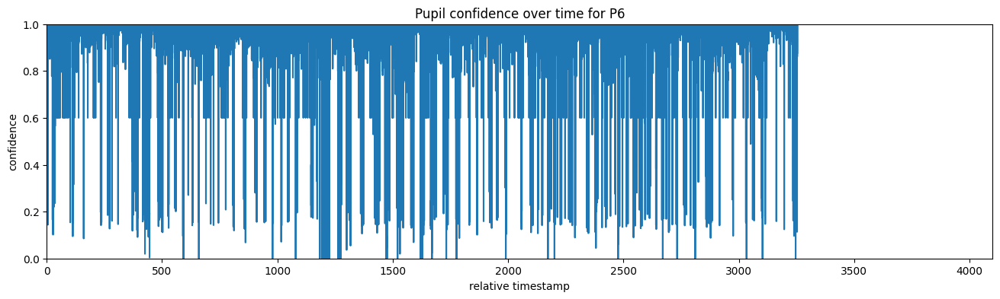

...

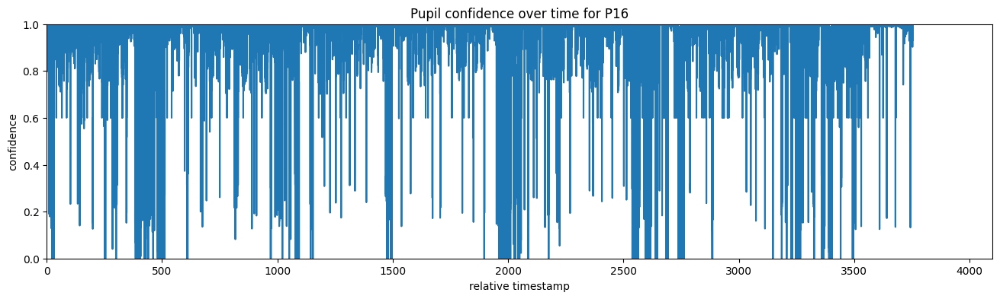

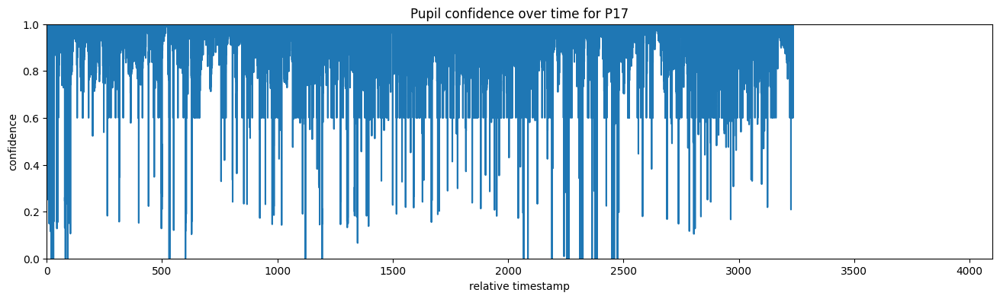

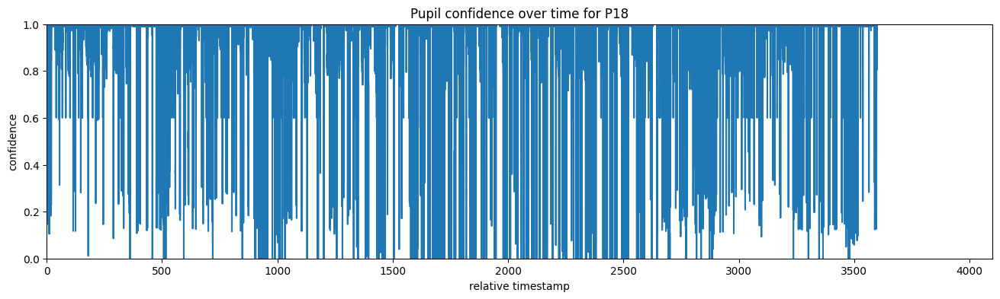

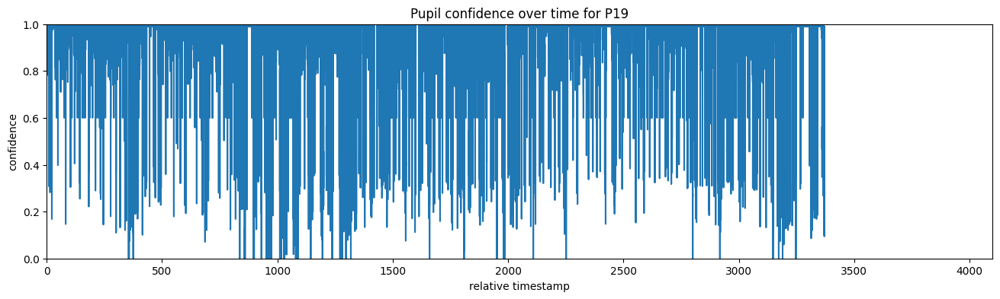

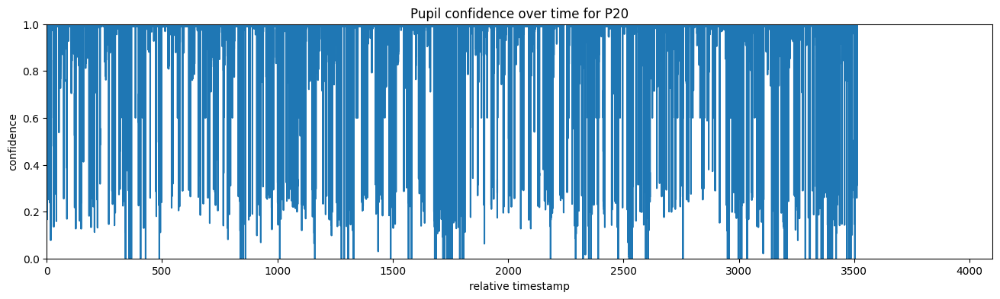

In [ ]:
df['relative_timestamp'] = df.groupby('participant_id')['pupil_timestamp'].transform(lambda x: x - x.min())
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['confidence'])
    plt.title(f'Pupil confidence over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('confidence')
    plt.xlim(0, 4100)
    plt.ylim(0, 1)
    plt.show()

##### Diameter 3d over time
- Larger high-frequency flactuations (ex: P4, P8)
- Low confidence based on bot diameter value (dispersed) and time (small window size with low confidence)

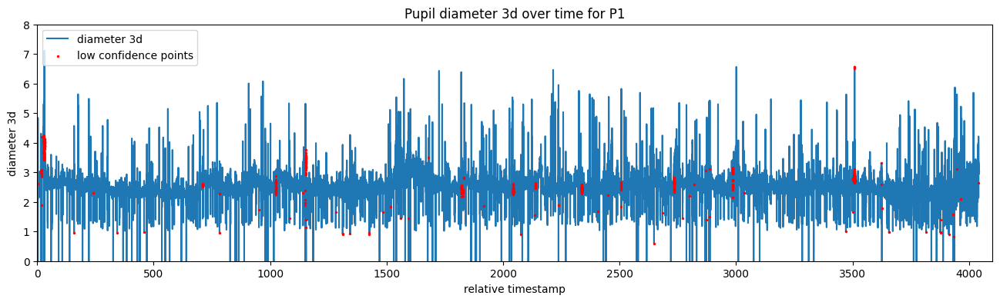

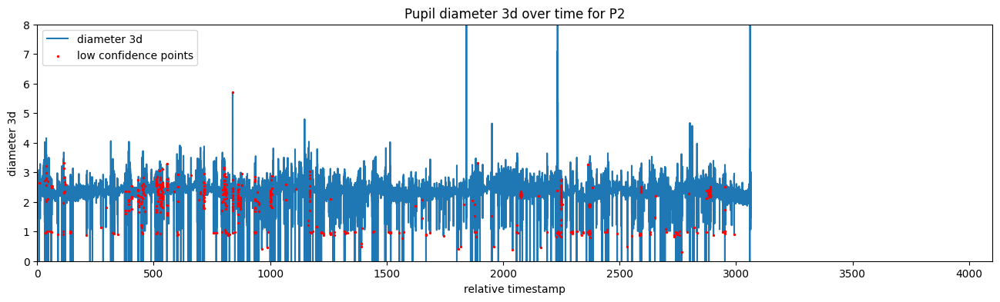

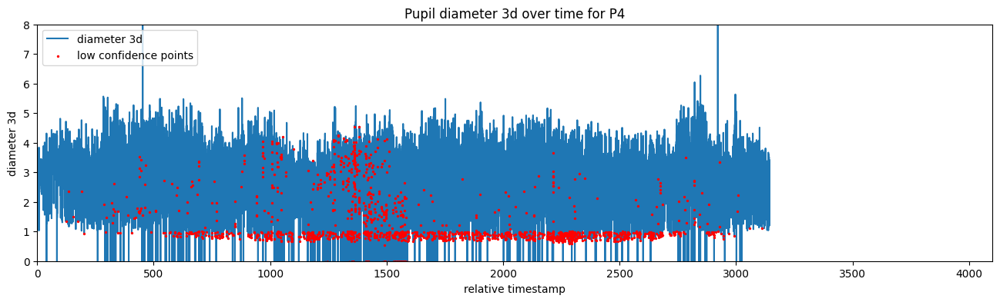

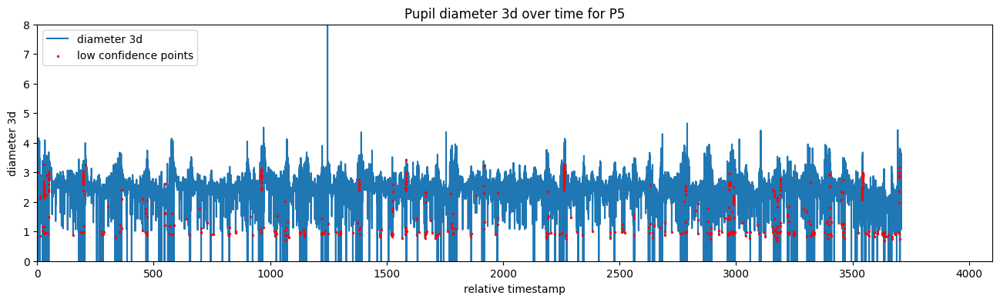

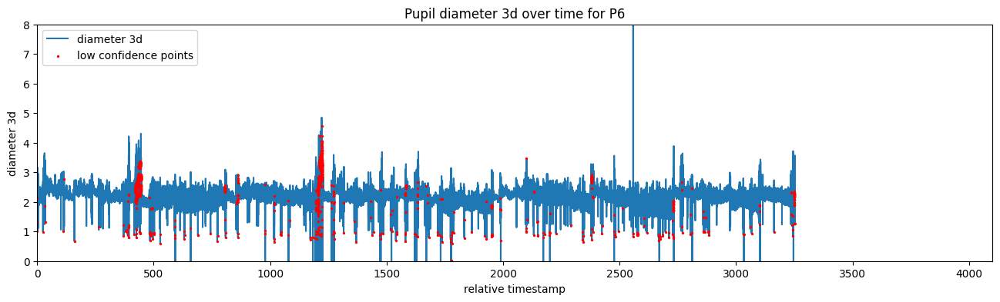

...

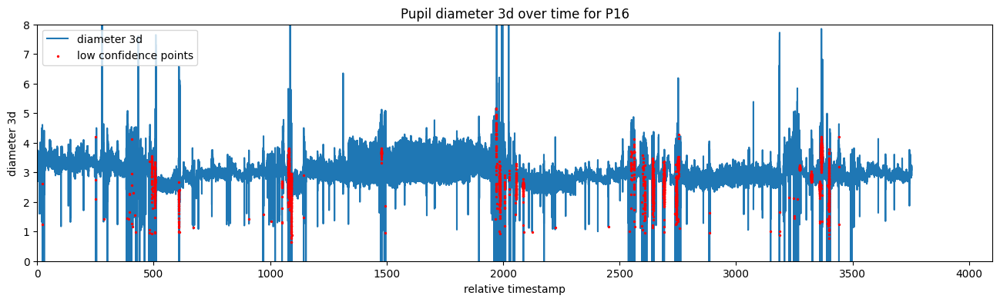

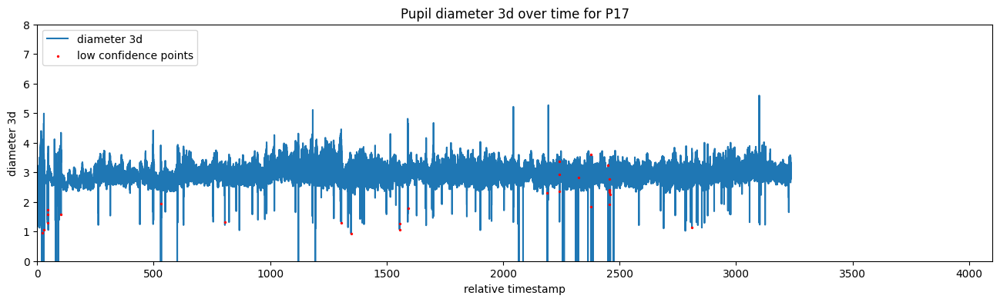

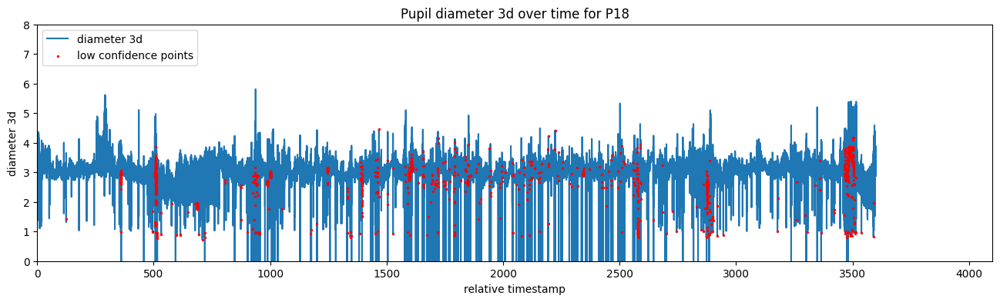

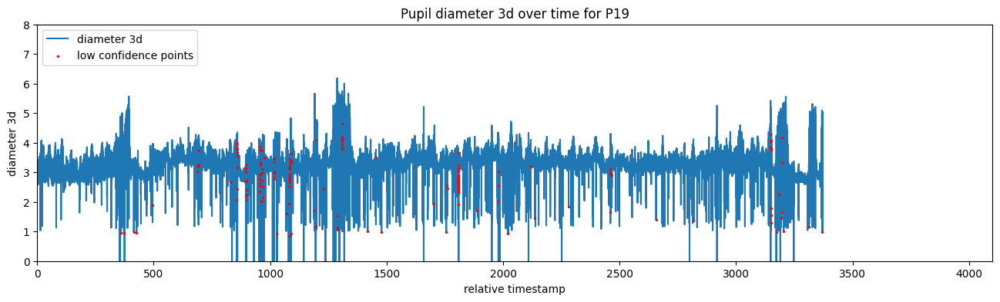

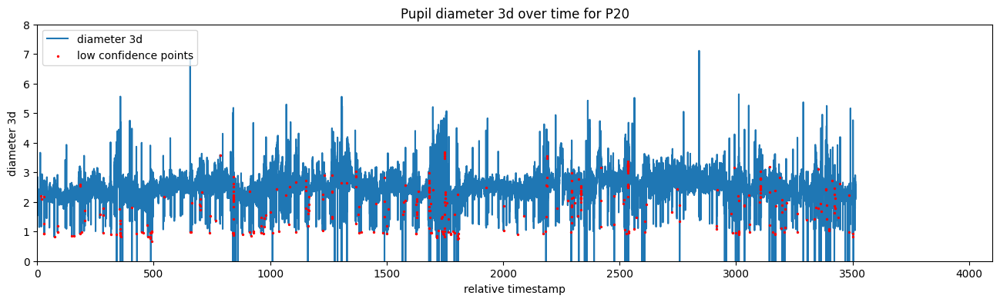

In [ ]:
for pid in participant_ids:
    participant_df = df[df['participant_id'] == pid]
    low_conf = participant_df[participant_df['model_confidence'] <= 0.5]
    plt.figure(figsize=(16, 4))
    plt.plot(participant_df['relative_timestamp'], participant_df['diameter_3d'], label='diameter 3d')
    plt.scatter(low_conf['relative_timestamp'], low_conf['diameter_3d'], color='red', s=2, label='low confidence points', zorder=2)
    plt.title(f'Pupil diameter 3d over time for P{pid}')
    plt.xlabel('relative timestamp')
    plt.ylabel('diameter 3d')
    plt.xlim(0, 4100)
    plt.ylim(0,8)
    plt.legend(loc="upper left")
    plt.show()

### 4. Case-Specific Check-Ups
Confidence cut

##### Confidence cut (0.6-0.7)
- Result of mathematical adjustment in the calculations

SOLVED: Adjustment of the latest release (v3.5)
 
'In some cases, pye3d was overestimating the confidence of its pupil detections. These were visible as noisy gaze estimations in the Pupil Core applications. This release includes an updated version of pye3d with adjusted confidence estimations. As a result, the gaze signal should look more stable during lower confidence situations, e.g. while squinting or looking down.'  

'Version 0.2.0 of pye3d has lowered 3d-search-result confidence by 40%. When the confidence of the input 2d pupil datum is lower than a specific threshold (0.7), pye3d attempts to reconstruct the 2d pupil ellipse based on its existing 3d eye model. We noticed that the confidence for these results was systematically overestimated given the actual detection result quality and have therefore adjusted  the overall confidence assignment for them.'  

https://pupil-labs.com/releases/core  
https://github.com/pupil-labs/pye3d-detector/pull/36/commits/f3c65817991d681627f3965c2486ac8e3f775d9e  
https://github.com/pupil-labs/pupil-detectors/blob/master/src/pupil_detectors/detector_2d/detector_2d.pyx  
https://github.com/pupil-labs/pupil-detectors/blob/master/src/pupil_detectors/detector_2d/detect_2d.hpp

##### Model confidence binary (0.1, 1)
- Bounds control

SOLVED: Change Release v3.4
'[...] pye3d assigns different model_confidence values based on the long-term model's parameters. Specifically, model_confidence is set to 1.0 by default and set to 0.1 if at least one model output exceeds its physiologically reasonable range. If the ranges are exceeded, it is likely that the model is either not fit well or the 2d input ellipse was a false detection.  

The assumed physiological bounds are:  
phi: [-80, 80] degrees  
theta: [-80, 80] degrees  
pupil diameter: [1.0, 9.0] mm  
eyeball center x: [-10, 10] mm  
eyeball center y: [-10, 10] mm  
eyeball center z: [20, 75] mm  

https://pupil-labs.com/releases/core